# DMD
## Overview
Let $X\in \mathbf{R}^{M\times N}$ be a data matrix. 
- Each column of $X$ is a snapshot of the system.
- Each row of $X$ is a time series of a single variable.  
We consider several snapshots, denoted as $X_{i_1}^{i_2} = [\mathbf{x}_{i_1}, \mathbf{x}_{i_1+1}, \ldots, \mathbf{x}_{i_2}]$. The full snapshot matrix is $X = X_{1}^{N}=[\mathbf{x}_1, \mathbf{x}_2, \ldots, \mathbf{x}_{N}]$. The full snapshot matrix is $X = X_{1}^{N}=[\mathbf{x}_1, \mathbf{x}_2, \ldots, \mathbf{x}_{N}]$, where each $\mathbf{x}_i=\mathbf{x}(t_i)\in \mathbf{R}^{M}$, is a snapshot of the system at time $t_i =t_1+(i-1)\Delta t $.  

## Assumption of DMD
The standard **DMD** relies on the assumption:
$$\mathbf{x}_{i+1} = A\mathbf{x}_i$$
$$\Leftrightarrow  X_{2}^{N} = AX_{1}^{N-1}$$
where $A$ is a linear operator.
If $A$ is known, and has eigendecomposition $A = \Phi\Lambda \Phi^{-1}$, then the solution to the DMD problem is:
$$\mathbf{x}(t_i) = A^{(i-1)}\mathbf{x}_1\\
\Leftrightarrow \mathbf{x}(t_i) = \Phi \Lambda^{(i-1)}\Phi^{-1}\mathbf{x}_1\\
\Rightarrow \mathbf{x}(t_i) = \sum_{m=1}^M \phi_m e^{(\delta_m + i\omega_m)(i-1)\Delta t}b_m$$
where $t_1$ is the initial time, $\delta_m + i\omega_m = \frac{1}{\Delta t}\log(\lambda_m)$, $\phi_m = \Phi\mathbf{e}_m$, and $b_m = \mathbf{e}_m^*\Phi^{-1}\mathbf{x}_1$.

### Problems with the above methods:
1. $A$ is not known.
2. $A$ is not necessarily diagonalizable.
3. $A$ is not necessarily invertible.
4. $A$ is a very large matrix, and hence computationnaly expensive.
So we need to find a way to compute the DMD modes without knowing $A$.

## Efficient DMD Algorithm: DMD modes without knowing $A$
The DMD algorithm is a method to compute the dominant modes of $X$. The algorithm is as follows:

1. Compute the SVD of $X_1^{N-1}$:
   $$X_1^{N-1} = U\Sigma V^*$$
We can take low-rank SVD:
   $$X_1^{N-1} \approx U_r\Sigma_r V_r^*$$
   where $U_r$ is the first $r$ columns of $U$, $\Sigma_r$ is the first $r$ rows and columns of $\Sigma$, and $V_r$ is the first $r$ columns of $V$.
2. Compute the reduced-order model:
   $$\hat{A} = U_r^*AU_r =  U_r^*X_2^{N} V_r \Sigma_r^{-1} \in \mathbb{C}^{r \times r}$$
   where $X_2^{N}$ is the matrix of snapshots from $x_2$ to $x_N$.
3. Compute the eigenvalues and eigenvectors of $\hat{A}$: $$\hat{A}W = W\Lambda$$
   $$\Lambda,W = \{\lambda_1,...,\lambda_r\}, \{w_1,...,w_r\} = \text{eig}(\hat{A})$$
4. Compute the DMD modes:
$$\Phi = U_r W \in \mathbb{C}^{M \times r} $$

where $\Omega = [\omega_1,...,\omega_r]$.
We have here 
$$A\Phi =U_r (\hat{A} W) = U_r (W \Lambda) = \Phi \Lambda$$
which shows that $\Phi$ is the matrix of DMD modes and $\lambda_1,...,\lambda_r$ are the DMD eigenvalues.
5. Compute the DMD time series:
$$\mathbb{x}(t_i) = \Phi \cdot (\Lambda ^ {i-1}) \cdot \Phi^{-1} \cdot \mathbb{x}(t_1) \in \mathbb{C}^{M \times 1}$$




## Efficient DMD Algorithm: DMD modes without knowing $A$
The DMD algorithm is a method to compute the dominant modes of $X$. The algorithm is as follows:

1. Compute the SVD of $X_1^{N-1}$:
   $$X_1^{N-1} = U\Sigma V^*$$
We can take low-rank SVD:
   $$X_1^{N-1} \approx U_r\Sigma_r V_r^*$$
   where $U_r$ is the first $r$ columns of $U$, $\Sigma_r$ is the first $r$ rows and columns of $\Sigma$, and $V_r$ is the first $r$ columns of $V$.

2. Compute the reduced-order model:
   $$\hat{A} = U_r^*AU_r =  U_r^*X_2^{N} V_r \Sigma_r^{-1} \in \mathbb{C}^{r \times r}$$
   where $X_2^{N}$ is the matrix of snapshots from $x_2$ to $x_N$.

3. Compute the eigenvalues and eigenvectors of $\hat{A}$: $$\hat{A}W = W\Lambda$$
   $$\Lambda,W = \{\lambda_1,...,\lambda_r\}, \{w_1,...,w_r\} = \text{eig}(\hat{A})$$

4. Compute the DMD modes:
$$\Phi = U_r W \in \mathbb{C}^{M \times r} $$

where $\Omega = [\omega_1,...,\omega_r]$.
We have here 
$$A\Phi =U_r (\hat{A} W) = U_r (W \Lambda) = \Phi \Lambda$$
which shows that $\Phi$ is the matrix of DMD modes and $\lambda_1,...,\lambda_r$ are the DMD eigenvalues.

5. Compute the DMD time series:
$$\mathbb{x}(t_i) = \Phi \cdot (\Lambda ^ {i-1}) \cdot \Phi^{-1} \cdot \mathbb{x}(t_1) \in \mathbb{C}^{M \times 1}\\ $$


In [34]:
import os 
import sys 
sys.path.append("../src/")
from lib import*

In [2]:
# import numpy as np 
# import matplotlib.pyplot as plt 
# from scipy import io 
# import sys 
# sys.path.append('../src/')
# from lib import*
# Load the data
data = io.loadmat('../dataset/VORTALL.mat')
X = data['VORTALL']
X = X[:,:]

#Number of time frames
T = X.shape[1]

(89351, 151)
(89351,)


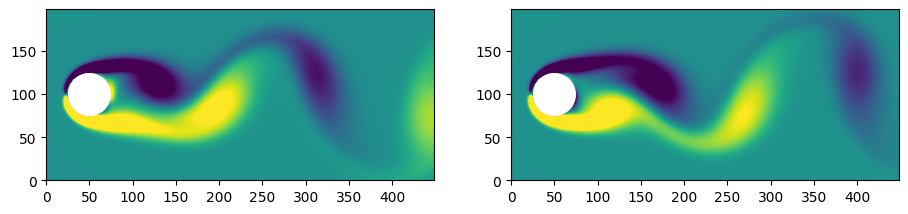

In [3]:

fig, ax= plt.subplots(1,2,figsize=(11, 4))
print(X.shape)
ax[0].contourf(np.real(np.reshape(X[:,0],(449,199))).T, levels = 1001, vmin=-2, vmax=2)
ax[0].scatter(50,100,900,color='white', zorder=2) # draw cylinder
ax[0].set_aspect('equal')

ax[1].contourf(np.real(np.reshape(X[:,10],(449,199))).T, levels = 1001, vmin=-2, vmax=2)
ax[1].scatter(50,100,900,color='white', zorder=2) # draw cylinder
ax[1].set_aspect('equal')
print(X[:,0].shape)

# DMD

- Precision in pytorch

Using GPU: NVIDIA GeForce RTX 3090
Starting benchmark analysis...
Testing SVD rank: 2
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: GPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix shape: (89351, 150), Reduced rank: 2
A_tilde shape: (2, 2)
Performing eigendecomposition...
Number of modes: 2
Eigenvalue range: [9.79e-01, 1.00e+00]
Testing SVD rank: 22
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: GPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix shape: (89351, 150), Reduced rank: 22
A_tilde shape: (22, 22)
Performing eigendecomposition...
Number of modes: 22
Eigenvalue range: [9.18e-02, 1.00e+00]
Testing SVD rank: 42
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: GPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double pre

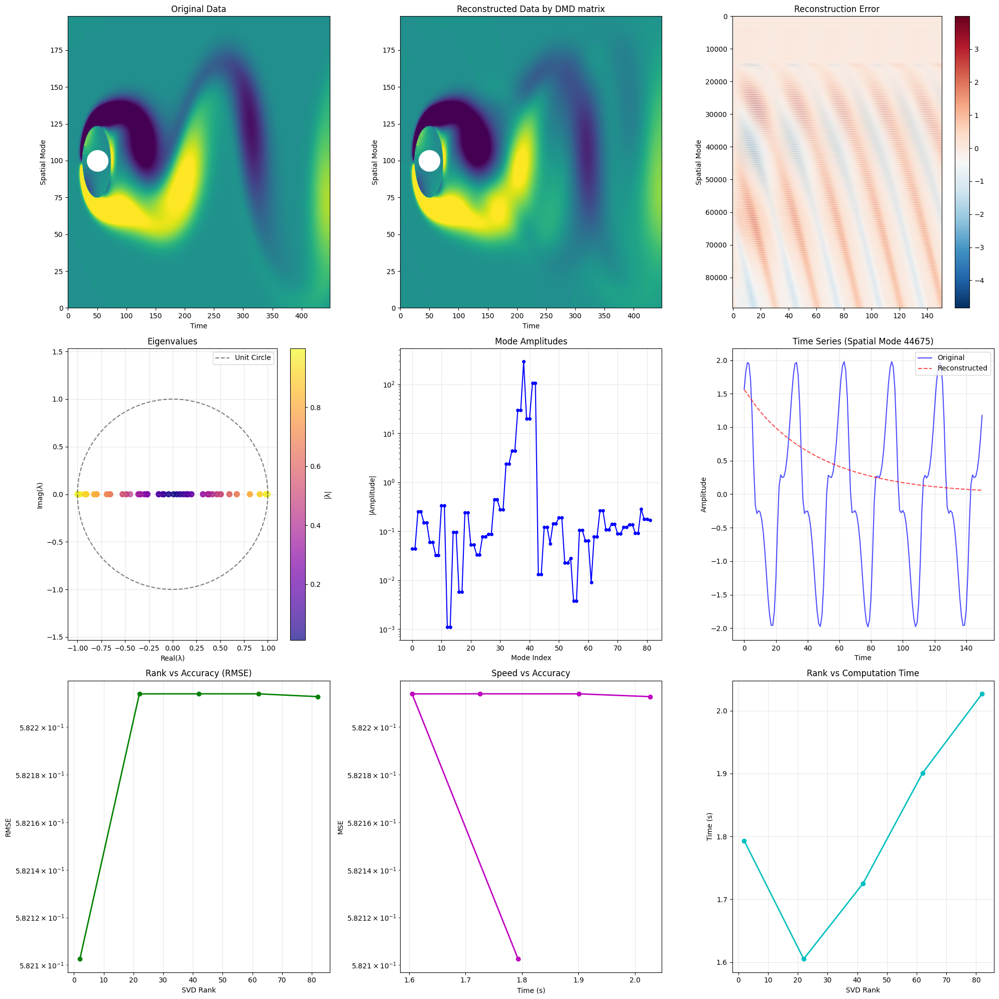

{'mse': 0.338971678272968,
 'rmse': 0.5822127431385953,
 'mae': 0.33852883620368585,
 'relative_error': 0.5207859371918747,
 'energy_ratio': 0.7858367255011189,
 'correlation': 0.8542937096364716,
 'r_squared': 0.7287820076002245,
 'snr_db': 5.6668150311332095,
 'stable_modes': 82,
 'unstable_modes': 0,
 'total_modes': 82,
 'condition_number': 2.2874244592927173e+18}

In [4]:
dmd = DMD(gpu=True, precision='double')
dmd.benchmark_analysis(X, rank_list=np.arange(2,100,20))
dmd.visualize_results()
dmd.compute_statistics()

- Numpy - CPU

Starting benchmark analysis...
Testing SVD rank: 2
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: CPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix shape: (89351, 150), Reduced rank: 2
A_tilde shape: (2, 2)
Performing eigendecomposition...
Number of modes: 2
Eigenvalue range: [9.79e-01, 1.00e+00]
Testing SVD rank: 22
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: CPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix shape: (89351, 150), Reduced rank: 22
A_tilde shape: (22, 22)
Performing eigendecomposition...
Number of modes: 22
Eigenvalue range: [6.56e-01, 1.00e+00]
Testing SVD rank: 42
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: CPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix sha

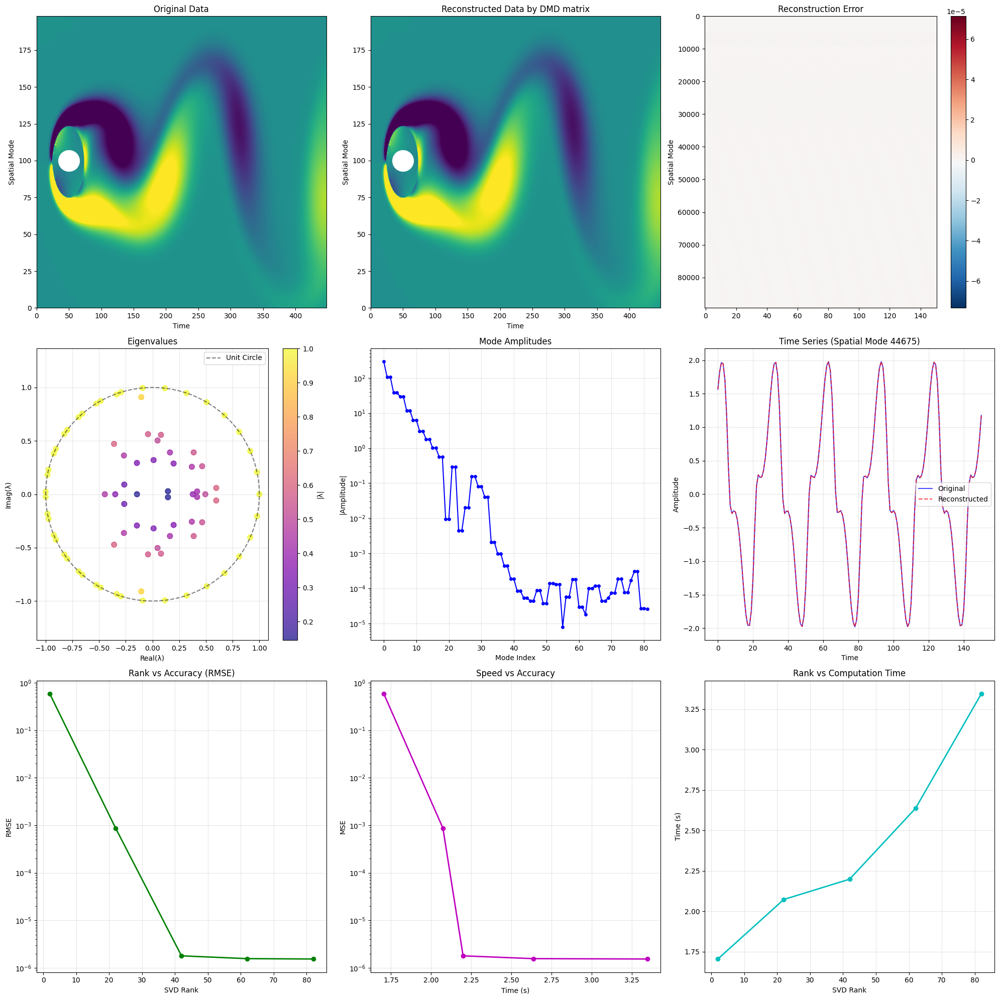

{'mse': 2.372687962335959e-12,
 'rmse': 1.5403531940227083e-06,
 'mae': 5.503208114667504e-07,
 'relative_error': 1.3778370384528849e-06,
 'energy_ratio': 1.0000000771072757,
 'correlation': 0.9999999999990518,
 'r_squared': 0.9999999999981015,
 'snr_db': 117.21604289799906,
 'stable_modes': 66,
 'unstable_modes': 16,
 'total_modes': 82,
 'condition_number': 33.15307392636017}

In [5]:
dmd = DMD(gpu=False, precision='double')
dmd.benchmark_analysis(X, rank_list=np.arange(2,100,20))
dmd.visualize_results()
dmd.compute_statistics()

# HODMD



## Assumption of HODMD

The **Higher Order Dynamic Mode Decomposition (HODMD)** extends standard DMD by incorporating a **delay embedding**, which allows for better detection of multiple frequencies and more robustness in noisy or nonlinear systems.

Instead of assuming a direct relation $ \mathbf{x}_{i+1} = A\mathbf{x}_i $, we assume that the dynamics are governed by a linear operator acting on a **delay-embedded state vector**:

$$
\mathbf{z}_{i+1} = A_d \mathbf{z}_i
$$

where $ \mathbf{z}_i = [\mathbf{x}_i, \mathbf{x}_{i+1}, \ldots, \mathbf{x}_{i+d-1}]^\top $ is the delay-embedded state vector of dimension $ Md $, and $ d $ is the delay parameter.

This implies:

$$
\mathcal{X}_{d+1}^{N} = A_d \mathcal{X}_{1}^{N-d}
$$

where $ \mathcal{X}_{1}^{N-d} $ and $ \mathcal{X}_{d+1}^{N} $ are delay-embedded matrices constructed from $ X $.

## Problems with Standard DMD

Standard DMD may fail when:
1. The system has **multiple dominant frequencies**
2. The system is affected by **noise**
3. The dynamics are **nonlinear**

HODMD addresses these issues by using delay embedding, allowing us to:
- Extract **multiple frequencies**
- Improve **accuracy and robustness**
- Better model complex systems

## Efficient HODMD Algorithm

### Step-by-step procedure:

#### 1. Build Delay-Embedded Matrices

Given the original data matrix $ X \in \mathbb{R}^{M \times N} $, construct the delay-embedded matrices:

$$
\mathcal{X}_1 = 
\begin{bmatrix}
\mathbf{x}_1 & \mathbf{x}_2 & \cdots & \mathbf{x}_{N-d} \\
\mathbf{x}_2 & \mathbf{x}_3 & \cdots & \mathbf{x}_{N-d+1} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{x}_d & \mathbf{x}_{d+1} & \cdots & \mathbf{x}_N
\end{bmatrix}
\in \mathbb{R}^{Md \times N - d + 1}
$$

Split into two parts:

$$
\mathcal{X}_1 = \text{columns } 1 \text{ to } N - d,\quad \mathcal{X}_2 = \text{columns } 2 \text{ to } N - d + 1
$$
#### 2. Perform SVD on $ \mathcal{X}_1 $

Compute the singular value decomposition:

$$
\mathcal{X}_1 = U \Sigma V^*
$$

Optionally truncate to rank $ r $:

$$
U_r = U[:, :r],\quad \Sigma_r = \text{diag}(\Sigma[:r]),\quad V_r = V[:, :r]
$$

#### 3. Compute Reduced Operator

Project the dynamics onto the low-rank subspace:

$$
\hat{A} = U_r^* \mathcal{X}_2 V_r \Sigma_r^{-1} \in \mathbb{C}^{r \times r}
$$

#### 4. Eigen-decomposition of $ \hat{A} $

Solve the eigenvalue problem:

$$
\hat{A} W = W \Lambda
$$

Where:
- $ \Lambda = \text{diag}(\lambda_1, ..., \lambda_r) $: eigenvalues (complex)
- $ W = [\mathbf{w}_1, ..., \mathbf{w}_r] $: eigenvectors

#### 5. Compute Full-Space DMD Modes

Reconstruct the DMD modes in the full space:

$$
\Phi = U_r W \in \mathbb{C}^{Md \times r}
$$

To map back to the original space:

$$
\phi_m^{(original)} = \frac{1}{d} \sum_{k=1}^d \phi_m^{(k)}
$$

Where $ \phi_m^{(k)} $ is the $ k $-th block of $ \Phi \mathbf{e}_m $, corresponding to the $ k $-th delay component.

#### 6. Reconstruct Time Series

Using the initial amplitude coefficients $ b $, computed via least squares:

$$
b = \arg\min_{\mathbf{b}} \left\| \Phi \mathbf{b} - \mathcal{X}_1[:, 0] \right\|
$$

Then the solution is:

$$
\mathbf{x}(t_i) = \sum_{m=1}^r b_m \phi_m e^{(\delta_m + i\omega_m)(i-1)\Delta t}
$$

Where:
- $ \log(\lambda_m) = (\delta_m + i\omega_m)\Delta t $
- $ \phi_m $: spatial mode
- $ b_m $: amplitude coefficient

- PRecision in torch

Using GPU: NVIDIA GeForce RTX 3090
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 20
Precision: double
Device: GPU
Creating Hankel matrix with delay d=20...
Hankel matrix shape: (1787020, 132)
H1 shape: (1787020, 131), H2 shape: (1787020, 131)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 131
Performing eigendecomposition...
Number of modes: 131
Eigenvalue range: [1.22e-02, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 20
Precision: double
Device: GPU
Creating Hankel matrix with delay d=20...
Hankel matrix shape: (1787020, 132)
H1 shape: (1787020, 131), H2 shape: (1787020, 131)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [9.19e-02, 1.00e+00]
Benchmark completed.


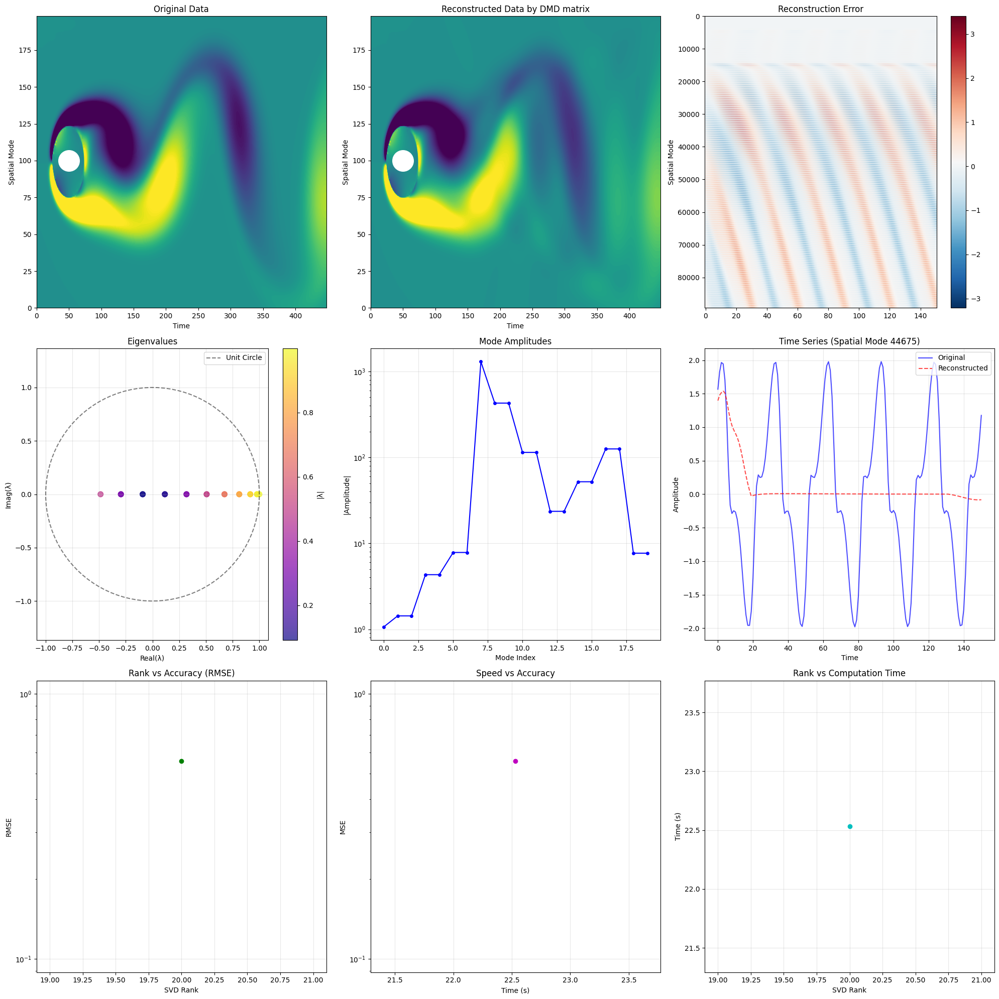

Using GPU: NVIDIA GeForce RTX 3090
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 30
Precision: double
Device: GPU
Creating Hankel matrix with delay d=30...
Hankel matrix shape: (2680530, 122)
H1 shape: (2680530, 121), H2 shape: (2680530, 121)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 121
Performing eigendecomposition...
Number of modes: 121
Eigenvalue range: [1.52e-02, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 30
Precision: double
Device: GPU
Creating Hankel matrix with delay d=30...
Hankel matrix shape: (2680530, 122)
H1 shape: (2680530, 121), H2 shape: (2680530, 121)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [9.18e-02, 1.00e+00]
Benchmark completed.


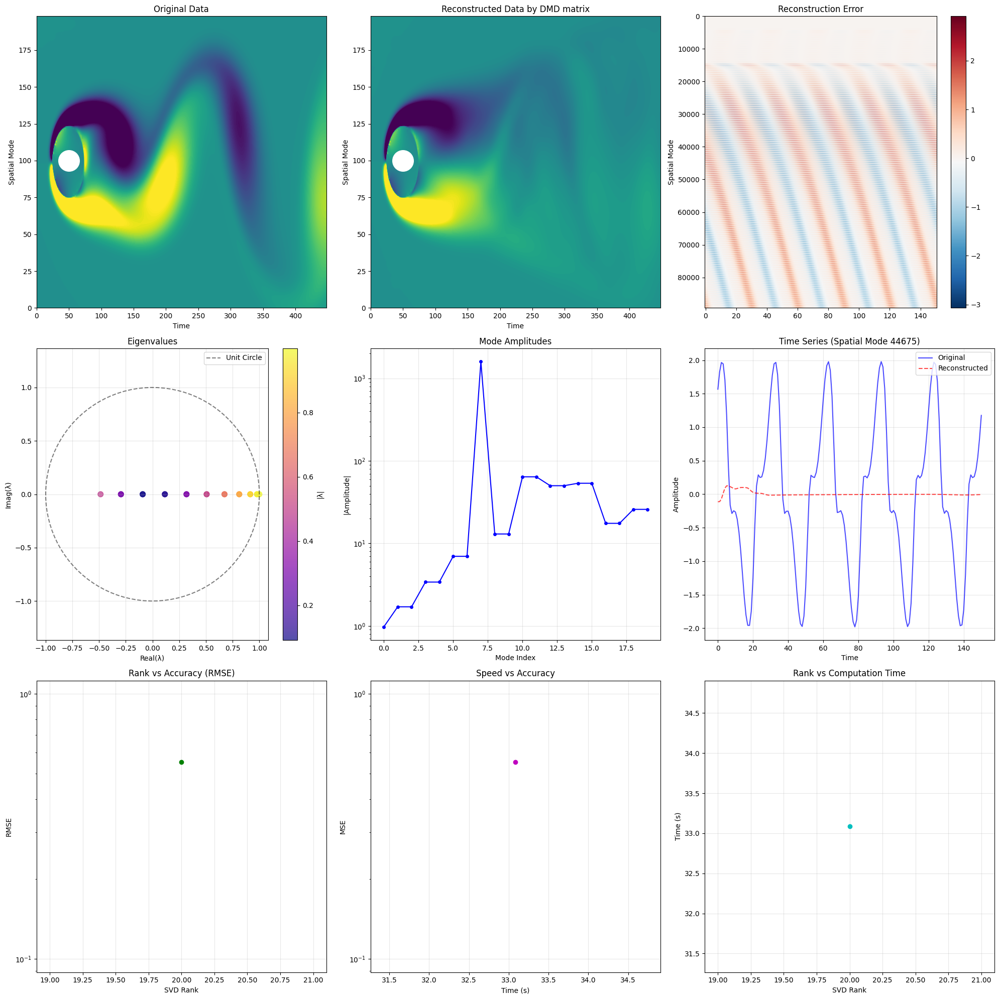

Using GPU: NVIDIA GeForce RTX 3090
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 40
Precision: double
Device: GPU
Creating Hankel matrix with delay d=40...
Hankel matrix shape: (3574040, 112)
H1 shape: (3574040, 111), H2 shape: (3574040, 111)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 111
Performing eigendecomposition...
Number of modes: 111
Eigenvalue range: [1.81e-02, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 40
Precision: double
Device: GPU
Creating Hankel matrix with delay d=40...
Hankel matrix shape: (3574040, 112)
H1 shape: (3574040, 111), H2 shape: (3574040, 111)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [9.19e-02, 1.00e+00]
Benchmark completed.


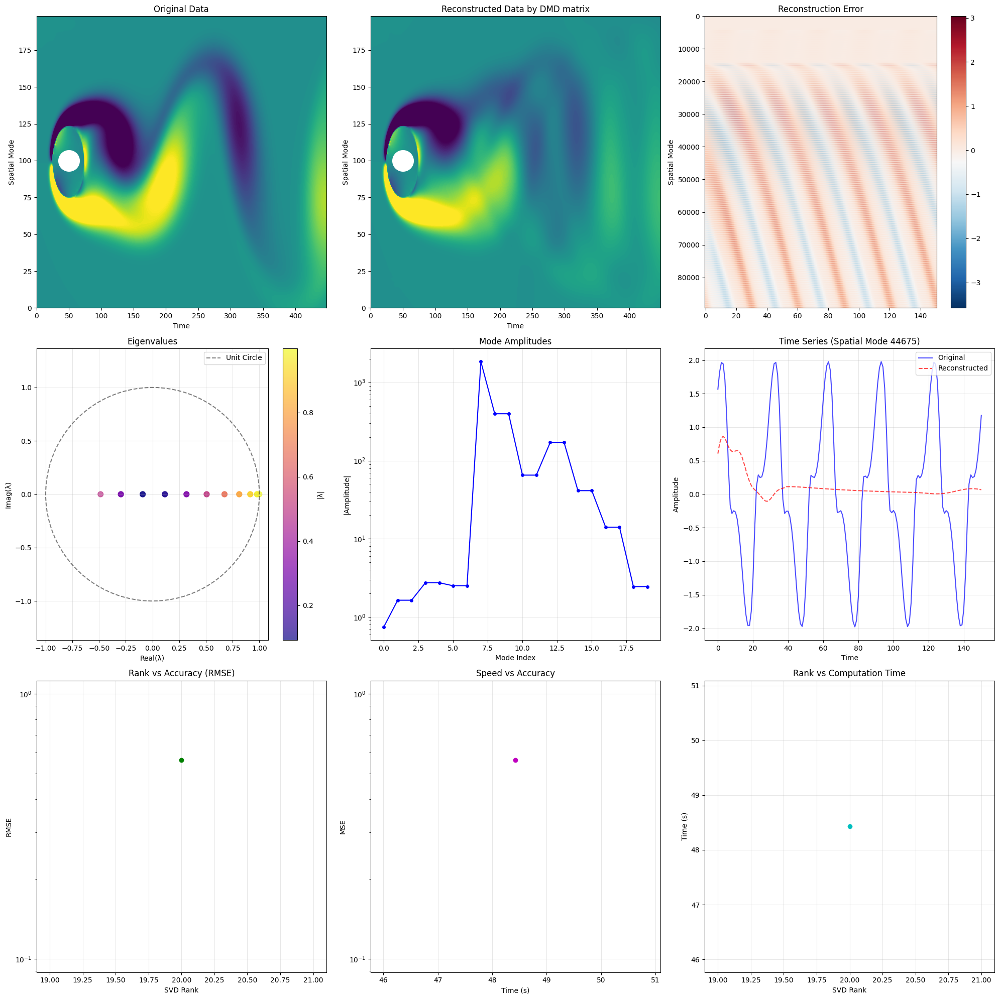

Using GPU: NVIDIA GeForce RTX 3090
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 50
Precision: double
Device: GPU
Creating Hankel matrix with delay d=50...
Hankel matrix shape: (4467550, 102)
H1 shape: (4467550, 101), H2 shape: (4467550, 101)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 101
Performing eigendecomposition...
Number of modes: 101
Eigenvalue range: [1.80e-02, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 50
Precision: double
Device: GPU
Creating Hankel matrix with delay d=50...
Hankel matrix shape: (4467550, 102)
H1 shape: (4467550, 101), H2 shape: (4467550, 101)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [9.19e-02, 1.00e+00]
Benchmark completed.


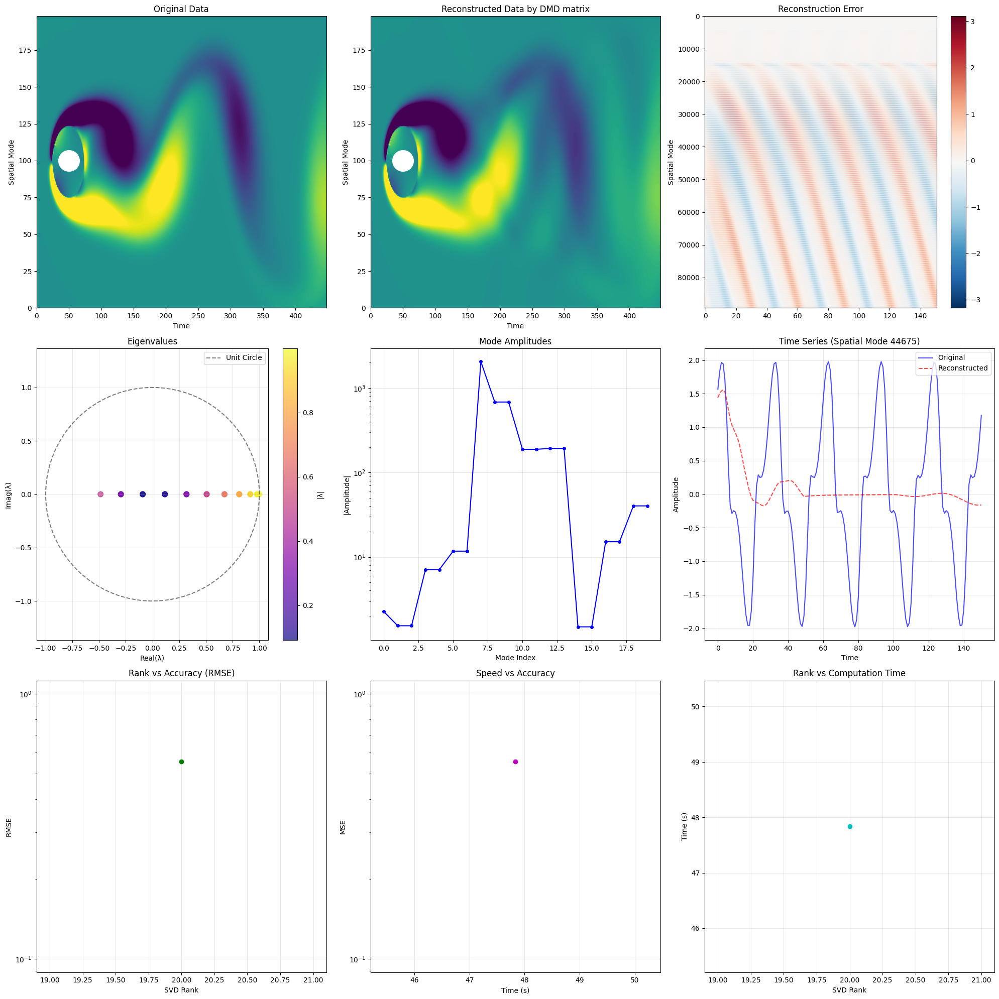

In [6]:
# for d in [20, 30, 40, 50]:
#     print(f"\n\nDelay = {d}\n\n")
for d in [20, 30, 40, 50]:
    hodmd = HODMD(d=d,gpu=True, precision='double')
    hodmd.fit(X)
    hodmd.benchmark_analysis(X, rank_list=np.arange(20,21))
    hodmd.visualize_results()
    hodmd.compute_statistics()
    

Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 20
Precision: double
Device: CPU
Creating Hankel matrix with delay d=20...
Hankel matrix shape: (1787020, 132)
H1 shape: (1787020, 131), H2 shape: (1787020, 131)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 131
Performing eigendecomposition...
Number of modes: 131
Eigenvalue range: [1.80e-01, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 20
Precision: double
Device: CPU
Creating Hankel matrix with delay d=20...
Hankel matrix shape: (1787020, 132)
H1 shape: (1787020, 131), H2 shape: (1787020, 131)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [4.86e-01, 1.00e+00]
Benchmark completed.


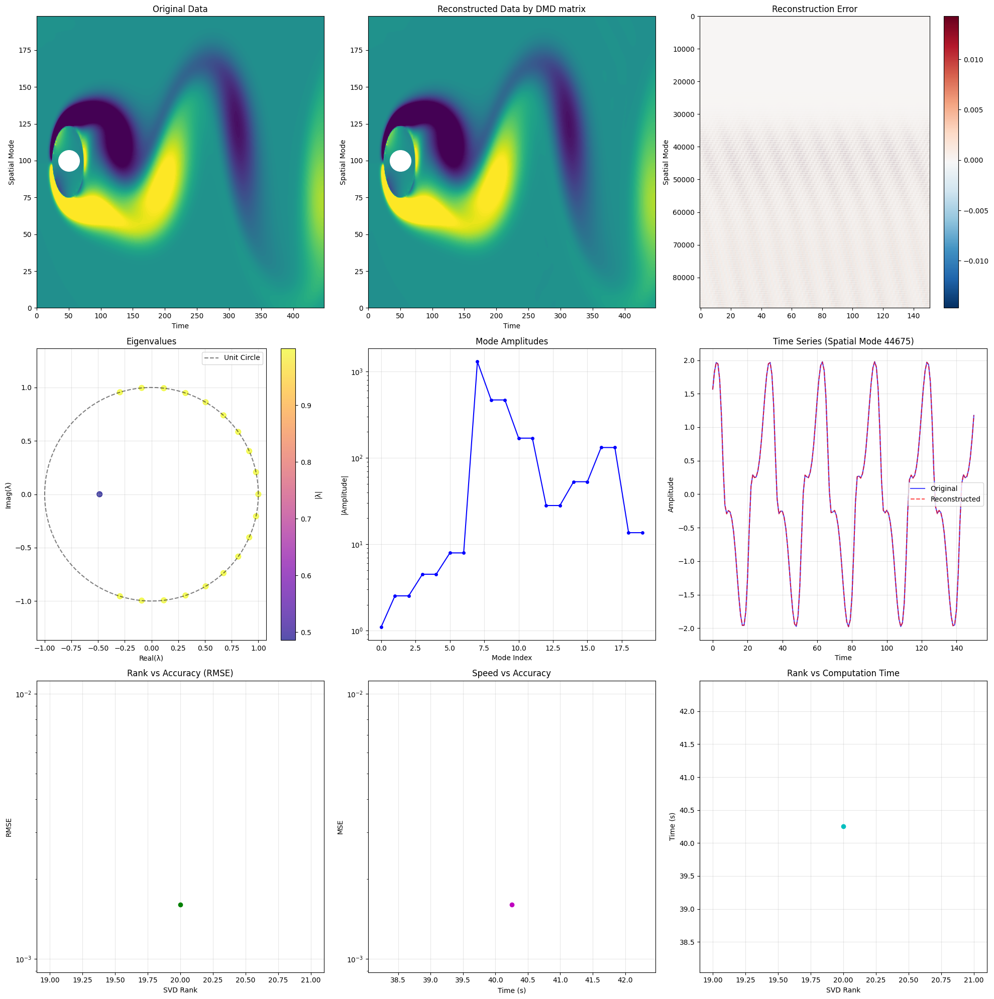

Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 30
Precision: double
Device: CPU
Creating Hankel matrix with delay d=30...
Hankel matrix shape: (2680530, 122)
H1 shape: (2680530, 121), H2 shape: (2680530, 121)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 121
Performing eigendecomposition...
Number of modes: 121
Eigenvalue range: [9.83e-01, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 30
Precision: double
Device: CPU
Creating Hankel matrix with delay d=30...
Hankel matrix shape: (2680530, 122)
H1 shape: (2680530, 121), H2 shape: (2680530, 121)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [4.86e-01, 1.00e+00]
Benchmark completed.


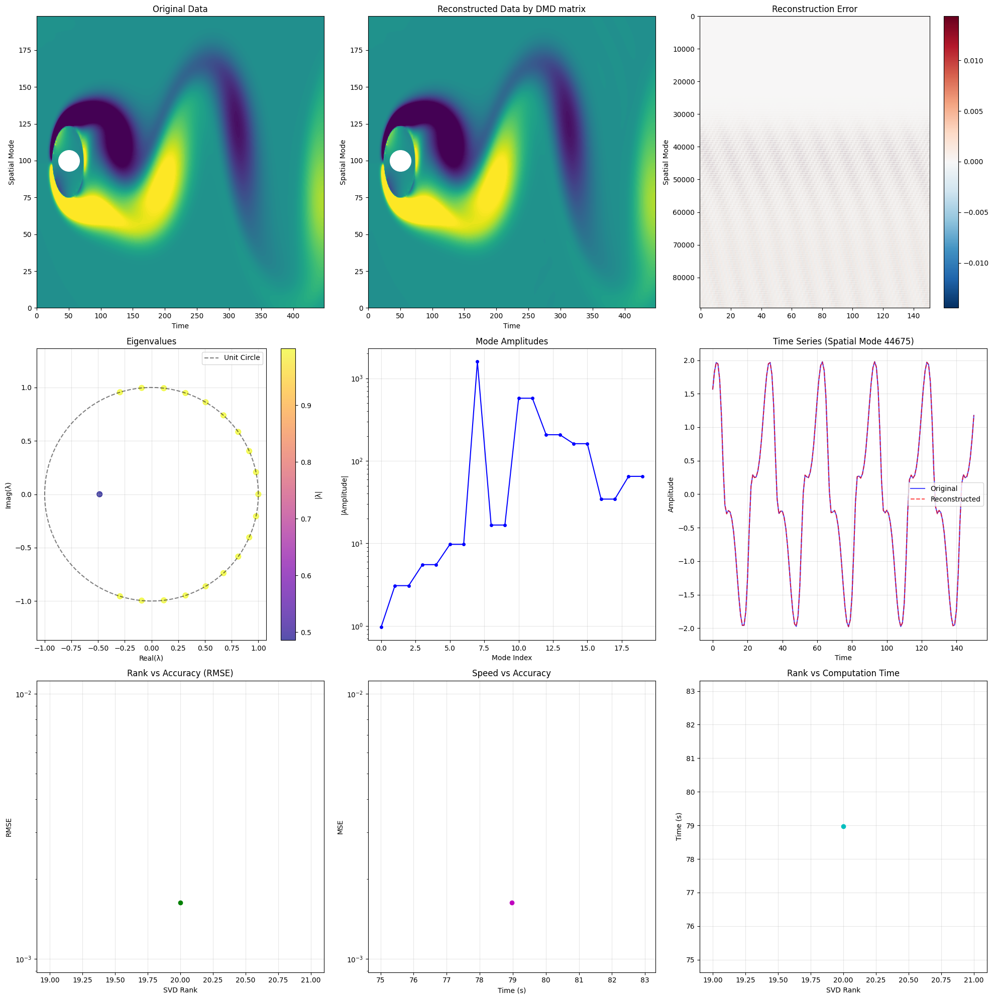

Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 50
Precision: double
Device: CPU
Creating Hankel matrix with delay d=50...
Hankel matrix shape: (4467550, 102)
H1 shape: (4467550, 101), H2 shape: (4467550, 101)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 101
Performing eigendecomposition...
Number of modes: 101
Eigenvalue range: [9.34e-02, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 50
Precision: double
Device: CPU
Creating Hankel matrix with delay d=50...
Hankel matrix shape: (4467550, 102)
H1 shape: (4467550, 101), H2 shape: (4467550, 101)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [4.86e-01, 1.00e+00]
Benchmark completed.


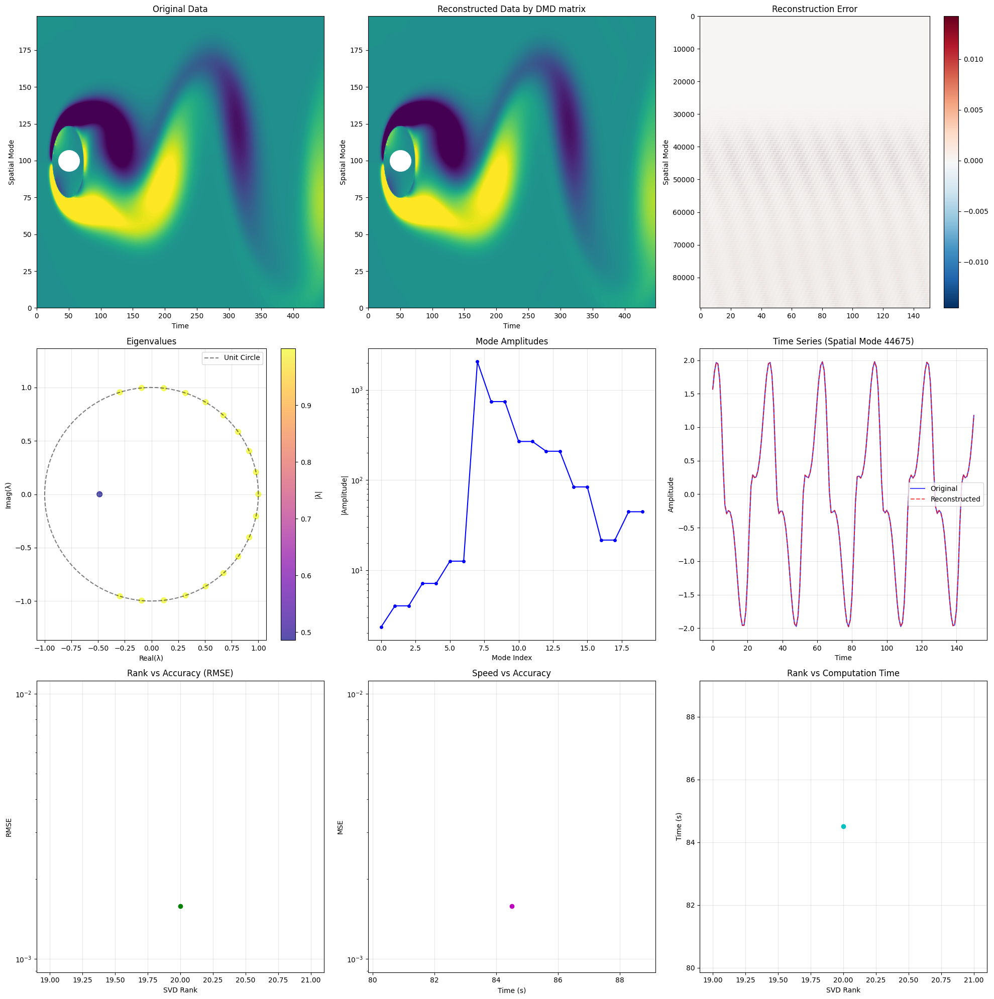

In [7]:
# for d in [20, 30, 40, 50]:
#     print(f"\n\nDelay = {d}\n\n")
for d in [20, 30, 50]:
    hodmd = HODMD(d=d,gpu=False, precision='double')
    hodmd.fit(X)
    hodmd.benchmark_analysis(X, rank_list=np.arange(20,21))
    hodmd.visualize_results()
    hodmd.compute_statistics()
    

# Tensor Train

## Introduction and motivations for tensor train

### what is a tensor ?
- A point is a 0-dimensional tensor (aka tensor of order 0)
- A vector is a 1-dimensional tensor (aka tensor of order 1)
- A matrix is a 2-dimensional tensor (aka tensor of order 2)
- A 3-dimensional tensor is a tensor of order 3. Example: a color RGB image is a 3-dimensional tensor
- A 4-dimensional tensor is a tensor of order 4. Example: a batch of color RGB images is a 4-dimensional tensor, or a video.
- etc.
### Tensor Train overview
A tensor $A∈\mathbb{R}^{n_1 \times \cdots n_d}$ is represented in the **TT format** as:
$$A(i_1,\cdots,i_d) = G_1(i_1)\cdots G_d(i_d) $$
Each $G_k(i_k)\in \mathbb{R}^{r_{k-1}}\times r_k$ is called a **TT-core** , where $r_0=1,r_d=1$, and $r_k$ are the TT-ranks .

![Tensor](../images/tensor.jpg "Tensor is multidimensional array")
![Tensor Train](../images/tensor_train.png "Tensor Train")


In [9]:
tensor_scalar = tl.tensor(1)
tensor_vector = tl.tensor([1, 2, 3])
tensor_matrix = tl.tensor([[1, 2, 3], [4, 5, 6]])
tensor_3d = tl.tensor(np.random.rand(3, 4, 5))
tensor_4d = tl.tensor(np.random.rand(3, 4, 5, 6))

print(f" 0 dimensional shape is {tensor_scalar.shape}, the number of its elements is {tensor_scalar.size}, and its order is {tensor_scalar.ndim}")
print(f" 1 dimensional shape is {tensor_vector.shape}, the number of its elements is {tensor_vector.size}, and its order is {tensor_vector.ndim}")
print(f" 2 dimensional shape is {tensor_matrix.shape}, the number of its elements is {tensor_matrix.size}, and its order is {tensor_matrix.ndim}")
print(f" 3 dimensional shape is {tensor_3d.shape}, the number of its elements is {tensor_3d.size}, and its order is {tensor_3d.ndim}")
print(f" 4 dimensional shape is {tensor_4d.shape}, the number of its elements is {tensor_4d.size}, and its order is {tensor_4d.ndim}")


 0 dimensional shape is (), the number of its elements is 1, and its order is 0
 1 dimensional shape is (3,), the number of its elements is 3, and its order is 1
 2 dimensional shape is (2, 3), the number of its elements is 6, and its order is 2
 3 dimensional shape is (3, 4, 5), the number of its elements is 60, and its order is 3
 4 dimensional shape is (3, 4, 5, 6), the number of its elements is 360, and its order is 4


### Problems with high dimensional tensors
- **Curse of dimensionality and Storage**: the number of elements grows exponentially with the order of the tensor
- **Computation**: the number of operations grows exponentially with the order of the tensor
- **Visualization**: it is impossible to visualize tensors with order greater than 3

In [10]:
n,d = 10,1
while d<=10:
    d = d+1
    tensor = n**d
    print(f"For tensor of order {d} which has {n} elements in each dimension, the number of elements is {tensor}")

For tensor of order 2 which has 10 elements in each dimension, the number of elements is 100
For tensor of order 3 which has 10 elements in each dimension, the number of elements is 1000
For tensor of order 4 which has 10 elements in each dimension, the number of elements is 10000
For tensor of order 5 which has 10 elements in each dimension, the number of elements is 100000
For tensor of order 6 which has 10 elements in each dimension, the number of elements is 1000000
For tensor of order 7 which has 10 elements in each dimension, the number of elements is 10000000
For tensor of order 8 which has 10 elements in each dimension, the number of elements is 100000000
For tensor of order 9 which has 10 elements in each dimension, the number of elements is 1000000000
For tensor of order 10 which has 10 elements in each dimension, the number of elements is 10000000000
For tensor of order 11 which has 10 elements in each dimension, the number of elements is 100000000000


## What is a Tensor Train (TT)
- It decomposes a high dimensional tensor into a sequence of 3D tensors, which are called cores (TT-cores). It reduces the computational cost and storage drastically.
- For a tensor $\mathcal{T} \in \mathbb{R}^{n_1 \times n_2 \times \ldots \times n_d}$, its TT-decompositions is: 

$$\mathcal{T}(i_1,...,i_d) = G^{(1)}(i_1) \cdot G^{(2)}(i_2) \cdot \ldots \cdot G^{(d)}(i_d)$$
where each $G^{(k)}$ is a 3D tensor of size $r_{k-1} \times n_k \times r_k$ and $r_0 = r_d = 1$. The numbers $r_k$ are called TT-ranks.



In [12]:
# Reconstruction of the original tensor from a TT-decomposition
d,r = [2,3,4],[1,2,3,1]
# G1 = np.random.randn(r[0],d[0],r[1])
# G2 = np.random.randn(r[1],d[1],r[2])
# G3 = np.random.randn(r[2],d[2],r[3])
G1 = np.arange(r[0]*d[0]*r[1]).reshape(r[0],d[0],r[1])
G2 = np.arange(r[1]*d[1]*r[2]).reshape(r[1],d[1],r[2])
G3 = np.arange(r[2]*d[2]*r[3]).reshape(r[2],d[2],r[3])
print("\nBasic implementation of tensor reconstruction\n")
tensor_reconstructed_1 = np.einsum("aib,bjc,ckd->ijk", G1, G2, G3)

tensor_reconstruced_2 = np.tensordot(np.tensordot(G1, G2, axes=([2], [0])), G3, axes=([3], [0])).reshape(d[0],d[1],d[2])
print(np.allclose(tensor_reconstructed_1, tensor_reconstruced_2))

print("einsum reconstruction: \n",tensor_reconstructed_1)
print("tensor dot reconstruction: \n",tensor_reconstruced_2)

def reconstruct_from_tt(G):
    tensor_reconstructed = G[0]
    dimensions = [x.shape[1] for x in G]
    for i in range(1, len(G)):
        tensor_reconstructed = np.tensordot(tensor_reconstructed, G[i], axes=([-1], [0]))
    return tensor_reconstructed.reshape(dimensions)
tensor_reconstructed_3 = reconstruct_from_tt([G1, G2, G3])
print(np.allclose(tensor_reconstructed_1, tensor_reconstructed_3))


Basic implementation of tensor reconstruction

True
einsum reconstruction: 
 [[[ 128  158  188  218]
  [ 164  203  242  281]
  [ 200  248  296  344]]

 [[ 424  520  616  712]
  [ 604  745  886 1027]
  [ 784  970 1156 1342]]]
tensor dot reconstruction: 
 [[[ 128  158  188  218]
  [ 164  203  242  281]
  [ 200  248  296  344]]

 [[ 424  520  616  712]
  [ 604  745  886 1027]
  [ 784  970 1156 1342]]]
True


In [13]:
shapes = (3,4,5,6)
tensor = np.arange(np.product(shapes)).reshape(shapes)
rank = 2

modes = len(shapes)

print(f"The shape of the original tensor is {tensor.shape} with number of element {tensor.size}")


The shape of the original tensor is (3, 4, 5, 6) with number of element 360


## TT-Ranks, Compression
### TT-Ranks
- It controls the storage cost, computational complexity and accuracy of the tensor. Low TT-ranks has efficient representation but low accuracy.
- TT-ranks are the dimensions of the core tensors.
### TT compression
- TT-SVD (sequential SVD-based compression)
- TT-Cross (interpolation-approximation based compression)
### TT_SVD algorithms decomposition
For a tensor $\mathcal{T} \in \mathbb{R}^{n_1 \times n_2 \times \ldots \times n_d}$. To find the core tensors $G^{(k)}$ and the TT-ranks $r_k$,
$$\mathcal{T}(i_1,...,i_d) = G^{(1)}(i_1) \cdot G^{(2)}(i_2) \cdot \ldots \cdot G^{(d)}(i_d)$$
its TT-SVD algorithm is as follow is: 
- **Step 1**: Unfolding into mod-1 tensor 
$\mathcal{T} \rightarrow \mathcal{T}_{(1)} \in \mathbb{R}^{n_1 \times (n_2 \times \ldots \times n_d)}$

- **Step 2**: SVD on mod-1 tensor  
-- $\mathcal{T}_{(1)} = U_1 \Sigma_1 V_1^T$, where $U_1 \in \mathbb{R}^{n_1 \times r_1}$, $\Sigma_1 \in \mathbb{R}^{r_1 \times r_1}$, and $V_1 \in \mathbb{R}^{(n_2 \times \ldots \times n_d) \times r_1}$  
-- $G^{(1)} = $ reshape $U_1 $ into $r_0 \times n_1 \times r_1$ and $\mathcal{T}_{(1)}' = \Sigma_1 \cdot V_1^T$

- **Step 3**: Reshaping into mod-1,2 tensor

-- $\mathcal{T}_{(1)}' \rightarrow \mathcal{T}_{(2)}' \in \mathbb{R}^{(r_1 n_2) \times (n_3 \times \ldots \times n_d)}$ 
- **Step 4**: SVD on mod-1,2 tensor  
-- $\mathcal{T}_{(2)}' = U_2 \Sigma_2 V_2^T$, where $U_2 \in \mathbb{R}^{(r_1 n_2) \times r_2}$, $\Sigma_2 \in \mathbb{R}^{r_2 \times r_2}$, and $V_2 \in \mathbb{R}^{(n_3 \times \ldots \times n_d) \times r_2}$  
-- $G^{(2)} = $ reshape $U_2 $ into $r_1 \times n_2 \times r_2$ and $\mathcal{T}_{(2)}'' = \Sigma_2 \cdot V_2^T$
- **Step 5**: Repeat step 3 and 4 until the last mode

In [16]:

print("\nBasic SVD implementation\n")
# SVD implementation 
import numpy as np


def reconstruct_from_tt(tt_cores):
    """
    Reconstructs a full tensor from its TT decomposition.

    Args:
        tt_cores (list of np.ndarray): List of TT cores. Each core has shape (r_prev, d_mode, r_next).

    Returns:
        np.ndarray: Reconstructed full tensor.
    """
    tensor = tt_cores[0]  # Start with first core
    for i in range(1, len(tt_cores)):
        # Contract along the bond dimension
        tensor = np.tensordot(tensor, tt_cores[i], axes=([-1], [0]))
    
    # Get original dimensions from the cores
    dimensions = [core.shape[1] for core in tt_cores]
    return tensor.reshape(dimensions)


def tt_svd(tensor, rank):
    """
    Perform TT-SVD decomposition of a full tensor.

    Args:
        tensor (np.ndarray): Input tensor of shape (d1, d2, ..., dn)
        rank (int or list): TT-ranks; if int, all intermediate ranks are set to this value

    Returns:
        list of np.ndarray: List of TT cores [G1, G2, ..., Gn]
    """
    shape = list(tensor.shape)
    n = len(shape)  # Number of dimensions

    # Handle rank input
    if isinstance(rank, int):
        rank = [rank] * n
    elif len(rank) != n:
        raise ValueError("Length of rank must match number of tensor dimensions.")

    # Prepend and append rank 1 at start/end
    tt_ranks = [1] + rank + [1]

    cores = []
    unfolding = tensor.copy()

    for i in range(n):
        if i==n-1:
            break
        curr_dim = shape[i]
        next_rank = tt_ranks[i + 1]

        # Reshape into matrix
        unfolding = unfolding.reshape(tt_ranks[i] * curr_dim, -1)

        # SVD
        U, S, Vt = np.linalg.svd(unfolding, full_matrices=False)

        # Truncate based on desired rank
        U_trunc = U[:, :next_rank]
        S_trunc = S[:next_rank]
        Vt_trunc = Vt[:next_rank, :]

        # Reshape U into TT-core
        core = U_trunc.reshape(tt_ranks[i], curr_dim, next_rank)
        cores.append(core)

        # Update unfolding with S @ Vt
        unfolding = np.diag(S_trunc) @ Vt_trunc
    unfolding = unfolding.reshape(tt_ranks[-2], shape[-1], tt_ranks[-1])
    cores.append(unfolding)
    return cores
from tensorly.decomposition import tensor_train

tt_tensor = tensor_train(tensor, rank=rank)
G = tt_svd(tensor,rank)
tensor_reconstructed_2 = reconstruct_from_tt(G)
print(f"The shape of the reconstructed tensor is {tensor_reconstructed_2.shape}")
print(f"The error is tensor and tt_svd {np.linalg.norm(tensor - tensor_reconstructed_2)}")


Basic SVD implementation

The shape of the reconstructed tensor is (3, 4, 5, 6)
The error is tensor and tt_svd 3.6017122230235946e-12


### Orthogonalization in TT-format
1. Left orthogonalization

We uses **QR** decomposition of the tensor to obtain the left orthogonal components.
All cores left of position k are orthogonal:
$$ \sum_{j=1}^{n_j} G_j(i)^TG_j(i) = I$$
Algorithms:  

Inputs : Cores of the TT-decomposition : $G_1$ (dim: $1\times n_1 \times r_1$), $G_2$(dim: $r_1 \times n_2 \times r_2 $),...  
**a.** Take a core $G_0$ and reshape it into $(1*n_1)\times r_1$  
**b.** Perform **SVD** decomposition( or QR) of current core (here $G_0$), i.e. $G_0=(U_0S_0V_0^T)$ where $Q=U_0:(n_1\times s_1)$ and $R=S_0V_0^T: (s_1 \times r_1)$ and takes the 1st core as $Q:$ reshape$(1,n_1,s_1)$  
**c.** Multiply $R$ to the next cores $G_1$, the result will be of shape $(s_1,n_2,r_2)$.  Reshape it into $(s_1*n_2,r_2)$
**d.** Perform **SVD** decomposition(seen as QR) of current core (here $G_1$), i.e. $G_1=(U_1S_1V_1^T)$ where $Q=U_1:((s_1*n_2)\times s_2)$ and $R=S_1V_1^T: (s_2 \times r_2)$ and takes the 2nd core as $Q:$ reshape$(s_1,n_2,s_2)$
**e.** Multiply $R$ to the next cores $G_2$, the result will be of shape $(s_2,n_3,r_3)$.  Reshape it into $(s_2*n_3,r_3)$
**f.** Repeat the steps until the last core.
The output will be a list of orthogonal cores.


2. Right orthogonalization

We uses **QR** decomposition of the transpose of the tensor to obtain the transpose of orthogonal components.
All cores left of position k are orthogonal:
$$ \sum_{j=1}^{n_j} G_j(i)G_j(i)^T = I$$

In [25]:

def tt_orthogonalize(tt_cores, types="svd", left_right="left"):
    '''
    inputs: tt_cores: list of numpy arrays or list of torch tensors
    args: types: "qr" or "svd"
          left_right: "left" or "right"
    outputs: tt_cores: list of numpy arrays or list of torch tensors
    '''

    if left_right == "left":
        d = len(tt_cores)
        for k in range(d - 1):
            # Reshape current core into a tall matrix: (r_prev * n_k) x r_curr
            G = tt_cores[k]
            r_prev, n_k, r_curr = G.shape
            Gmat = G.reshape(r_prev * n_k, r_curr)

            # QR decomposition to orthogonalize

            if k != d - 1:
                if types == "svd":

                    U, S, Vt = np.linalg.svd(Gmat, full_matrices=False)
                    Q = U
                    R = np.diag(S) @ Vt
                elif types == "qr":
                    Q, R = np.linalg.qr(Gmat)
                    U = Q
                else:
                    raise ValueError("Invalid type. Choose 'qr' or 'svd'.")
                # Update current core with orthogonal part
                tt_cores[k] = U.reshape(r_prev, n_k, U.shape[1])
            # Multiply R into the next core
                G_next = tt_cores[k + 1]
                r_next_prev, n_next, r_next_curr = G_next.shape
                # Reshape next core to apply R on the left
                G_next_reshaped = G_next.reshape(r_next_prev, n_next, r_next_curr)

                G_next_reshaped = np.einsum('ij,jkl->ikl', R, G_next_reshaped)
                r_next_prev, n_next, r_next_curr = G_next_reshaped.shape
                tt_cores[k + 1] = G_next_reshaped

            else:
                Q = Gmat

                tt_cores[k] = Gmat
    elif left_right == "right":
        d = len(tt_cores)
        for k in reversed(range(1, d)):
            G = tt_cores[k]
            r_prev, n_k, r_curr = G.shape
            # Reshape current core into a wide matrix: r_prev x (n_k * r_curr)
            Gmat = G.reshape(r_prev, n_k * r_curr)
            # SVD
            if types == "svd":
                U, S, Vt = np.linalg.svd(Gmat, full_matrices=False)
                # Vt: (rank, n_k * r_curr)
                # U: (r_prev, rank)
                # S: (rank,)
                rank = Vt.shape[0]
                # Update current core with right-orthogonal part
                tt_cores[k] = Vt.reshape(rank, n_k, r_curr)
                # Multiply U @ diag(S) into the previous core
                G_prev = tt_cores[k-1]
                r_prev_prev, n_prev, r_prev_curr = G_prev.shape
                G_prev_mat = G_prev.reshape(r_prev_prev * n_prev, r_prev_curr)
                # (r_prev_prev * n_prev, r_prev_curr) @ (r_prev_curr, rank)
                G_prev_new = G_prev_mat @ (U @ np.diag(S))
                tt_cores[k-1] = G_prev_new.reshape(r_prev_prev, n_prev, rank)
            elif types == "qr":
                # # QR decomposition
                # Q, R = np.linalg.qr(Gmat)


                # # Q: (r_prev, n_k * r_curr)
                # # R: (n_k * r_curr, n_k * r_curr)
                # # Update current core with right-orthogonal part


                # tt_cores[k] = Q.reshape(r_prev, n_k, r_curr)
                # # Multiply R into the previous core
                # G_prev = tt_cores[k-1]
                # r_prev_prev, n_prev, r_prev_curr = G_prev.shape
                # G_prev_mat = G_prev.reshape(r_prev_prev * n_prev, r_prev_curr)



                # # (r_prev_prev * n_prev, r_prev_curr) @ (r_prev_curr, n_k * r_curr)
                # G_prev_new = G_prev_mat @ R
                # tt_cores[k-1] = G_prev_new.reshape(r_prev_prev, n_prev, n_k * r_curr)
                raise NotImplementedError("Right orthogonalization with QR decomposition is not implemented.")
            else:
                raise ValueError("Invalid orthogonalization type. Choose 'svd' or 'qr'.")

    return tt_cores

def left_orthogonalize(tt_cores):
    d = len(tt_cores)

    for k in range(d - 1):
        # Reshape current core into a tall matrix: (r_prev * n_k) x r_curr
        G = tt_cores[k]
        r_prev, n_k, r_curr = G.shape
        Gmat = G.reshape(r_prev * n_k, r_curr)

        # QR decomposition to orthogonalize
        if k!=d-1:
            U, S, Vt = np.linalg.svd(Gmat,full_matrices=False)
            Q = U
            R = np.diag(S) @ Vt
            # Update current core with orthogonal part
            tt_cores[k] = U.reshape(r_prev, n_k, U.shape[1])
        # Multiply R into the next core
            G_next = tt_cores[k + 1]
            r_next_prev, n_next, r_next_curr = G_next.shape
            # Reshape next core to apply R on the left
            G_next_reshaped = G_next.reshape(r_next_prev, n_next, r_next_curr)

            G_next_reshaped = np.einsum('ij,jkl->ikl', R, G_next_reshaped)
            r_next_prev, n_next, r_next_curr = G_next_reshaped.shape
            tt_cores[k + 1] = G_next_reshaped

        else:
            Q = Gmat

            tt_cores[k] = Gmat

        print(f"tt_cores{k}.shape: {tt_cores[k].shape}")
    print(f"tt_cores[-1].shape: {tt_cores[-1].shape}")
    return tt_cores


def right_orthogonalize(tt_cores):
    d = len(tt_cores)
    for k in reversed(range(1, d)):
        G = tt_cores[k]
        r_prev, n_k, r_curr = G.shape
        # Reshape current core into a wide matrix: r_prev x (n_k * r_curr)
        Gmat = G.reshape(r_prev, n_k * r_curr)
        # SVD
        U, S, Vt = np.linalg.svd(Gmat, full_matrices=False)
        # Vt: (rank, n_k * r_curr)
        # U: (r_prev, rank)
        # S: (rank,)
        rank = Vt.shape[0]
        # Update current core with right-orthogonal part
        tt_cores[k] = Vt.reshape(rank, n_k, r_curr)
        # Multiply U @ diag(S) into the previous core
        G_prev = tt_cores[k-1]
        r_prev_prev, n_prev, r_prev_curr = G_prev.shape
        G_prev_mat = G_prev.reshape(r_prev_prev * n_prev, r_prev_curr)
        # (r_prev_prev * n_prev, r_prev_curr) @ (r_prev_curr, rank)
        G_prev_new = G_prev_mat @ (U @ np.diag(S))
        tt_cores[k-1] = G_prev_new.reshape(r_prev_prev, n_prev, rank)
        print(f"tt_cores[{k}].shape: {tt_cores[k].shape}")
    print(f"tt_cores[0].shape: {tt_cores[0].shape}")
    return tt_cores
def is_left_orthogonal(core):
    r_prev, n, r_curr = core.shape
    Gmat = core.reshape(r_prev * n, r_curr)
    return np.allclose(Gmat.T @ Gmat, np.eye(r_curr))


def is_right_orthogonal(core):
    r_prev, n, r_curr = core.shape
    Gmat = core.reshape(r_prev, n * r_curr)
    return np.allclose(Gmat @ Gmat.T, np.eye(r_prev))


def DMD(X1, X2, r, dt):
        U, s, Vh = np.linalg.svd(X1, full_matrices=False)
        Ur = U[:, :r]
        Sr = np.diag(s[:r])
        Vr = Vh.conj().T[:, :r]

        Atilde = Ur.conj().T @ X2 @ Vr @ np.linalg.inv(Sr)
        Lambda, W = np.linalg.eig(Atilde)

        Phi = X2 @ Vr @ np.linalg.inv(Sr) @ W
        omega = np.log(Lambda) / dt

        alpha1 = np.linalg.lstsq(Phi, X1[:, 0], rcond=None)[0]
        b = np.linalg.lstsq(Phi, X2[:, 0], rcond=None)[0]

        time_dynamics = None
        for i in range(X1.shape[1]):
            v = np.array(alpha1)[:, 0] * np.exp(np.array(omega) * (i + 1) * dt)
            if time_dynamics is None:
                time_dynamics = v
            else:
                time_dynamics = np.vstack((time_dynamics, v))
        X_dmd = np.dot(np.array(Phi), time_dynamics.T)

        return Phi, omega, Lambda, alpha1, b, X_dmd, time_dynamics.T


# Define TT cores manually
tt_cores = [
    np.random.randn(1, 3, 5),   # Core 0
    np.random.randn(5, 4, 6),   # Core 1
    np.random.randn(6, 2, 1)    # Core 2
]

# Left orthogonalization
tt_cores_left = tt_orthogonalize(tt_cores.copy(), types="svd", left_right="right")

# Right orthogonalization
tt_cores_right = right_orthogonalize(tt_cores.copy())



tensor_reconstructed_left = reconstruct_from_tt(tt_cores_left)

tensor_reconstructed = reconstruct_from_tt(tt_cores)

error = np.linalg.norm(tensor_reconstructed - tensor_reconstructed_left)
relative_error = error / np.linalg.norm(tensor_reconstructed)
print("Left orthogonalization:")
print("Absolute error:", error)
print("Relative error:", relative_error)
for i,core in enumerate(tt_cores_right):
    print(f"{i}th core from right is right orthogonal: {is_right_orthogonal(core)}")
tensor_reconstructed_right = reconstruct_from_tt(tt_cores_right)
print(f"tensor_reconstructed_right.shape: {tensor_reconstructed_right.shape}")
error = np.linalg.norm(tensor_reconstructed - tensor_reconstructed_right)
relative_error = error / np.linalg.norm(tensor_reconstructed)

print("Absolute error:", error)
print("Relative error:", relative_error)

tt_cores[2].shape: (2, 2, 1)
tt_cores[1].shape: (5, 4, 2)
tt_cores[0].shape: (1, 3, 5)
Left orthogonalization:
Absolute error: 9.08883860428038e-15
Relative error: 9.672611163450154e-16
0th core from right is right orthogonal: False
1th core from right is right orthogonal: True
2th core from right is right orthogonal: True
tensor_reconstructed_right.shape: (3, 4, 2)
Absolute error: 9.08883860428038e-15
Relative error: 9.672611163450154e-16


In [27]:
import tensorly as tl 
def tt_orth_at(x, pos, dir):
    """Orthogonalize single core.

    x = orth_at(x, pos, 'left') left-orthogonalizes the core at position pos
    and multiplies the corresponding R-factor with core pos+1. All other cores
    are untouched. The modified tensor is returned.

    x = orth_at(x, pos, 'right') right-orthogonalizes the core at position pos
    and multiplies the corresponding R-factor with core pos-1. All other cores
    are untouched. The modified tensor is returned.

    See also orthogonalize.
    """

    # Adapted from the TTeMPS Toolbox.

    Un = x[pos] # get the core at position pos
    if dir.lower() == 'left':
        Q, R = tl.qr(Un.reshape(-1, x.rank[pos+1]), mode='reduced') # perform QR decomposition
        # Fixed signs of x.U{pos},  if it is orthogonal.
        # This needs for the ASCU algorithm when it updates ranks both sides.
        sR = np.sign(np.diag(R)) # get the signs of the diagonal elements of R
        Q = Q * sR # multiply Q by the signs
        R = (R.T * sR).T # multiply R by the signs

        # Note that orthogonalization might change the ranks of the core Xn
        # and X{n+1}. For such case, the number of entries is changed
        # accordingly.
        # Need to change structure of the tt-tensor
        # pos(n+1)
        #
        # update the core X{n}
        Un = Q.reshape(x.rank[pos], x.shape[pos], -1) # reshape Q to the core shape

        # update the core X{n+1}
        Un2 = R @ x[pos+1].reshape(x.rank[pos+1], -1) # multiply R by the next core

        # Check if rank-n is preserved
        x[pos] = Un.reshape(x[pos].shape[0],x[pos].shape[1],R.shape[0]) # update the current core
        x[pos+1] = Un2.reshape(R.shape[0],x[pos+1].shape[1],-1) # update the next core

        if R.shape[0] != x.rank[pos+1]:
            x.rank = list(x.rank) # convert the tuple to a list
            x.rank[pos+1] = R.shape[0] # assign the new value
            x.rank = tuple(x.rank) # convert the list back to a tuple
    elif dir.lower() == 'right':
        # mind the transpose as we want to orthonormalize rows
        Q, R = tl.qr(Un.reshape(x.rank[pos], -1).T, mode='reduced') # perform QR decomposition on the transpose
        # Fixed signs of x.U{pos},  if it is orthogonal.
        # This needs for the ASCU algorithm when it updates ranks both
        # sides.
        sR = np.sign(np.diag(R)) # get the signs of the diagonal elements of R
        Q = Q * sR # multiply Q by the signs
        R = (R.T * sR).T # multiply R by the signs

        Un = Q.T.reshape(-1, x.shape[pos], x.rank[pos+1]) # reshape Q transpose to the core shape
        Un2 = x[pos-1].reshape(-1, x.rank[pos]) @  R.T # multiply the previous core by R transpose

        x[pos] = Un.reshape(Un.shape[0],x[pos].shape[1],-1) # update the current core
        x[pos-1] = Un2.reshape(x[pos-1].shape[0],x[pos-1].shape[1],-1) # update the previous core

        if R.shape[0] != x.rank[pos]:
            x.rank = list(x.rank) # convert the tuple to a list
            x.rank[pos] = R.shape[0] # assign the new value
            x.rank = tuple(x.rank) # convert the list back to a tuple
    else:
        raise ValueError('Unknown direction specified. Choose either LEFT or RIGHT')

    return x


def tt_orth(x, pos):
    """Orthogonalize tensor.

    x = orthogonalize(x, pos) orthogonalizes all cores of the TTeMPS tensor x
    except the core at position pos. Cores 1...pos-1 are left-, cores pos+1...end
    are right-orthogonalized. Therefore,

    x = orthogonalize(x, 1) right-orthogonalizes the full tensor,

    x = orthogonalize(x, x.order) left-orthogonalizes the full tensor.

    See also orth_at.
    """

    # adapted from the TTeMPS Toolbox.

    # left orthogonalization till pos (from left)
    for i in range(pos):
        # print(f'Left orthogonalization {i}')
        x = tt_orth_at(x, i, 'left')

    # right orthogonalization till pos (from right)
    ndimX = len(x.factors)

    for i in range(ndimX-1, pos, -1):
        # print(f'Right orthogonalization {i}')
        x = tt_orth_at(x, i, 'right')

    return x
# Generate a TT tensor with size 
szY = [5, 6, 7, 8,9, 10]
szY = np.array(szY)

# and TT ranks
rankTT = [1, 2, 3, 4,3, 2, 1]
N = len(szY)

# TT-Tensor Ytt 
Ytt = tl.random.random_tt(shape=szY, rank=rankTT)

print(Ytt)
for n in range(N-1):
    """
    Perform the left orthogonalization on the core tensor n-th Yn of the TT tensor Y

    """
     
    Ytt_o = tt_orth_at(Ytt, n, 'left')

    # Check orthogonality of Ytt_o[n]
    Q = Ytt_o[n].reshape(-1,Ytt_o[n].shape[-1]).T @ Ytt_o[n].reshape(-1,Ytt_o[n].shape[-1])
    print(f'Left-Orthogonalize core {n}: orthogonality error :{np.linalg.norm(Q - np.eye(Ytt_o[n].shape[-1]))}')

factors list : rank-(1, 2, 3, 4, 3, 2, 1) matrix-product-state tensor of shape (5, 6, 7, 8, 9, 10) 
Left-Orthogonalize core 0: orthogonality error :3.5889560658131214e-16
Left-Orthogonalize core 1: orthogonality error :8.375426953300068e-16
Left-Orthogonalize core 2: orthogonality error :1.0790182720060398e-15
Left-Orthogonalize core 3: orthogonality error :3.443859324683243e-16
Left-Orthogonalize core 4: orthogonality error :6.281304118904621e-16


# Tensor Train DMD

## Idea of computational using tensor train 
- Get big matrix data 
- Transform the matrix into tensor 
- Use tensor train to compress the tensor 
- To find tensor $A$ given tensor data $X_1,X_2$ such that $X_1 = AX_2$
- Use left orthogonalization to find $A$, to reduce complexity

## DMD with tensor algorithms and its Similarity with **DMD** algorithms on matrix:
- Given a sequence of d-dimensional tensors  $X_i​∈\mathbb{R}^{n_1​×n_2​×⋯×_{n_d}}$​, stack them into two large tensor datasets $\mathcal{X}$ and $\mathcal{Y}$.
- Compute a low-rank TT-format decomposition  of these tensor datasets.
- Use properties of the TT-decomposition to compute the pseudoinverse  of the tensor unfolding $\mathcal{X}=\text{matricize}(\mathcal{X})$ without explicitly forming the full matrix.
- Compute the DMD operator $\mathcal{A}=\mathcal{Y}\mathcal{X}^+$, and extract its eigenvalues and eigenvectors — the DMD modes and frequencies.
     

- Precision in torch

(89351, 151)
Test data created with shape: (449, 199, 151)
Starting HODMD-TT Analysis
Input data shape: (449, 199, 151)
Algorithm 1: TT Decomposition
TT decomposition successful with ranks: [(1, 449, 20), (20, 199, 20), (20, 151, 1)]
Algorithm 2: Orthogonalization
Orthogonalization completed
Algorithm 3: Pseudo Inverse Computation
Pseudo inverse computed with effective rank: 20
Algorithm 4: DMD Computation
DMD computation completed with 9 modes
Eigenvalue magnitudes range: [0.999916, 1.000029]
Creating Hankel matrix with shape=(89351, 151)...
Algorithm 5: Data Reconstruction
Reconstruction completed with relative error: 0.031082
Algorithm 6: Quality Assessment
Quality Statistics:
  Relative Error: 0.031082
  Energy Ratio: 0.999214
  Correlation: 0.999517
  Stable/Unstable Modes: 2/7


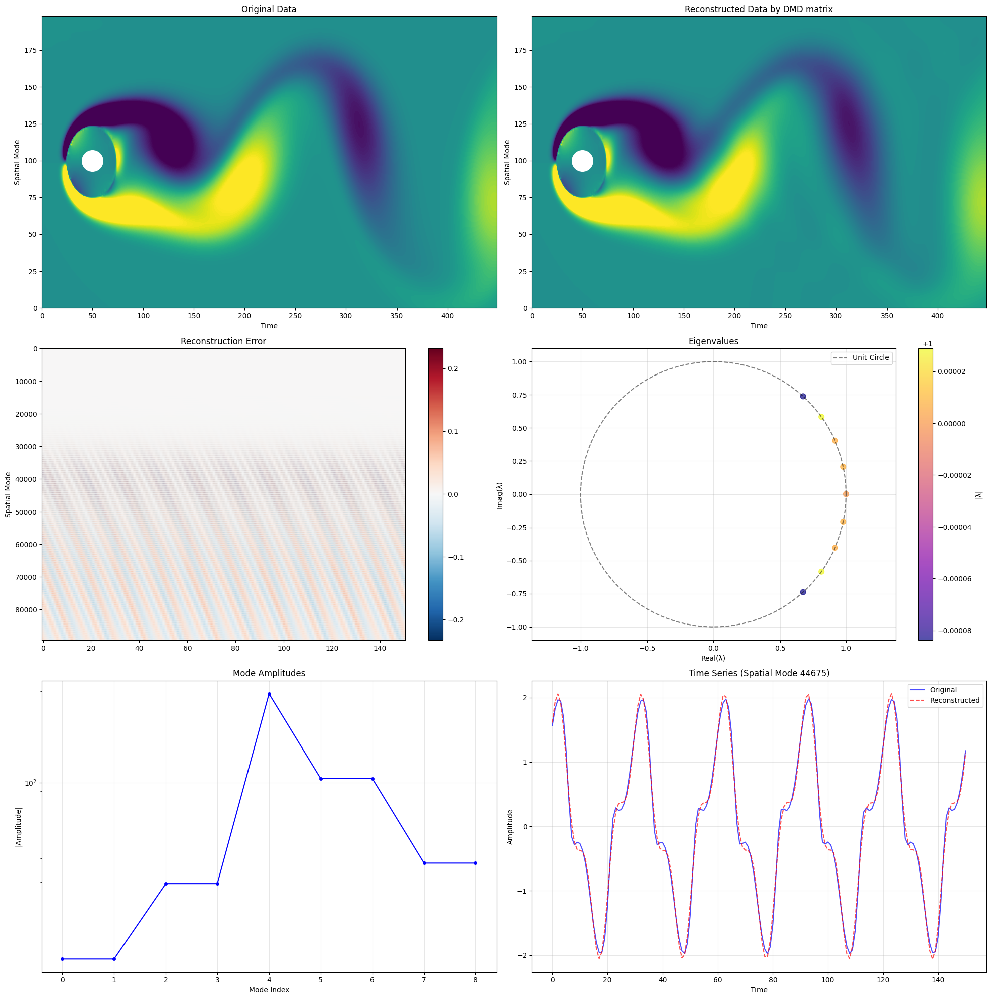

Starting benchmark analysis...
Testing SVD rank: 1
Starting HODMD-TT Analysis
Input data shape: (449, 199, 151)
Algorithm 1: TT Decomposition
TT decomposition successful with ranks: [(1, 449, 20), (20, 199, 20), (20, 151, 1)]
Algorithm 2: Orthogonalization
Orthogonalization completed
Algorithm 3: Pseudo Inverse Computation
Pseudo inverse computed with effective rank: 20
Algorithm 4: DMD Computation
DMD computation completed with 9 modes
Eigenvalue magnitudes range: [0.999916, 1.000029]
Creating Hankel matrix with shape=(89351, 151)...
Algorithm 5: Data Reconstruction
Reconstruction completed with relative error: 0.031082
Algorithm 6: Quality Assessment
Quality Statistics:
  Relative Error: 0.031082
  Energy Ratio: 0.999214
  Correlation: 0.999517
  Stable/Unstable Modes: 2/7
Testing SVD rank: 2
Starting HODMD-TT Analysis
Input data shape: (449, 199, 151)
Algorithm 1: TT Decomposition
TT decomposition successful with ranks: [(1, 449, 20), (20, 199, 20), (20, 151, 1)]
Algorithm 2: Orthog

In [35]:

# Example usage and test
def create_test_data():

    from scipy import io
    data = io.loadmat('../dataset/VORTALL.mat')
    X = data['VORTALL']
    X = X[:,:]
    # Add some noise
    print(X.shape)
    f = X.reshape(449,199,-1)
    
    print(f"Test data created with shape: {f.shape}")
    return f
# Run example

if __name__ == "__main__":
    test_data = create_test_data()
    
    # Initialize HODMD-TT
    hodmd = DMD_TT(rank=20, svd_rank=20)
    
    # Fit the model
    reconstructed_data, quality_stats = hodmd.fit(test_data)
    
    # Visualize results
    hodmd.visualize_results(test_data,reconstructed_data)
    hodmd.benchmark_analysis(test_data,reconstructed_data)
    print("\nDMD-TT Analysis Complete!")
    print("=" * 50)

# Robustness against noise

(89351, 151)
(89351,)


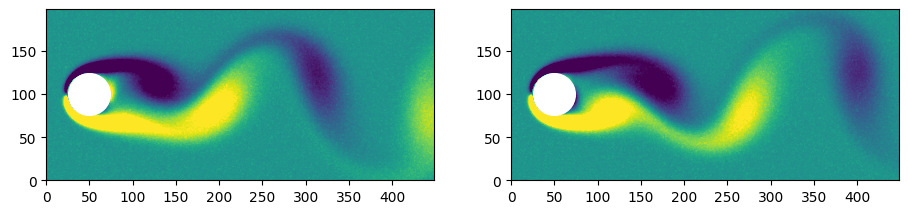

In [3]:
import os 
import sys 
sys.path.append("../src/")
from lib import*
# Load the data
data = io.loadmat('../dataset/VORTALL.mat')
X = data['VORTALL']
X = X[:,:] + 0.1*np.random.randn(X.shape[0],X.shape[1])
#Number of time frames
T = X.shape[1]

fig, ax= plt.subplots(1,2,figsize=(11, 4))
print(X.shape)
ax[0].contourf(np.real(np.reshape(X[:,0],(449,199))).T, levels = 1001, vmin=-2, vmax=2)
ax[0].scatter(50,100,900,color='white', zorder=2) # draw cylinder
ax[0].set_aspect('equal')

ax[1].contourf(np.real(np.reshape(X[:,10],(449,199))).T, levels = 1001, vmin=-2, vmax=2)
ax[1].scatter(50,100,900,color='white', zorder=2) # draw cylinder
ax[1].set_aspect('equal')
print(X[:,0].shape)

## DMD with noisy data 

Starting benchmark analysis...
Testing SVD rank: 2
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: CPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix shape: (89351, 150), Reduced rank: 2
A_tilde shape: (2, 2)
Performing eigendecomposition...
Number of modes: 2
Eigenvalue range: [9.79e-01, 1.00e+00]
Testing SVD rank: 22
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: CPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix shape: (89351, 150), Reduced rank: 22
A_tilde shape: (22, 22)
Performing eigendecomposition...
Number of modes: 22
Eigenvalue range: [8.92e-03, 1.00e+00]
Testing SVD rank: 42
Starting DMD Analysis
Data shape: (89351, 151)
Precision: double
Device: CPU
X1 shape: (89351, 150), X2 shape: (89351, 150)
Performing SVD decomposition with double precision...
SVD completed. Matrix sha

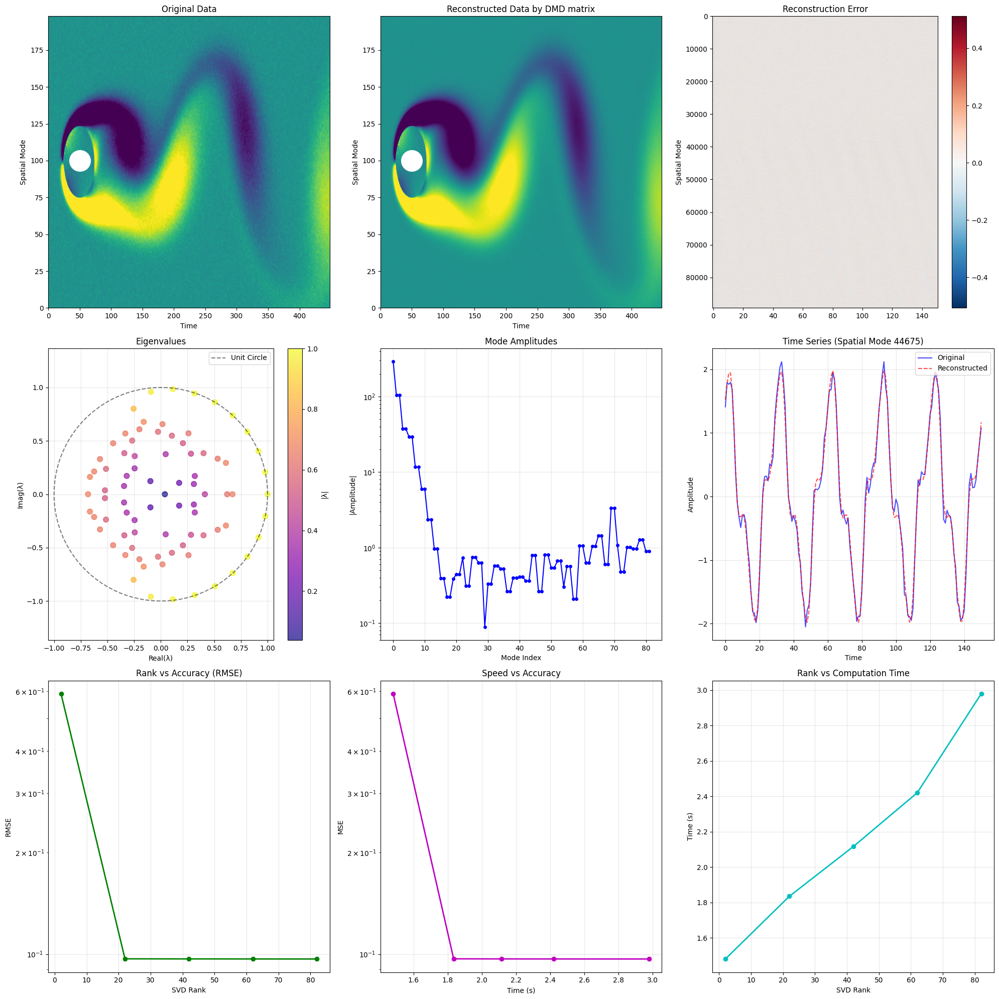

{'mse': 0.009350515172123446,
 'rmse': 0.09669806188400802,
 'mae': 0.07713490173450516,
 'relative_error': 0.08615132783070988,
 'energy_ratio': 0.9905424702149457,
 'correlation': 0.9962825876204986,
 'r_squared': 0.9925779487126685,
 'snr_db': 21.29476048965715,
 'stable_modes': 80,
 'unstable_modes': 2,
 'total_modes': 82,
 'condition_number': 46.38450044595302}

In [4]:
dmd = DMD(gpu=False, precision='double')
dmd.benchmark_analysis(X, rank_list=np.arange(2,100,20))
dmd.visualize_results()
dmd.compute_statistics()

## HODMD with noisy data 

Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 20
Precision: double
Device: CPU
Creating Hankel matrix with delay d=20...
Hankel matrix shape: (1787020, 132)
H1 shape: (1787020, 131), H2 shape: (1787020, 131)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 131
Performing eigendecomposition...
Number of modes: 131
Eigenvalue range: [6.02e-01, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 20
Precision: double
Device: CPU
Creating Hankel matrix with delay d=20...
Hankel matrix shape: (1787020, 132)
H1 shape: (1787020, 131), H2 shape: (1787020, 131)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [4.91e-01, 1.00e+00]
Benchmark completed.


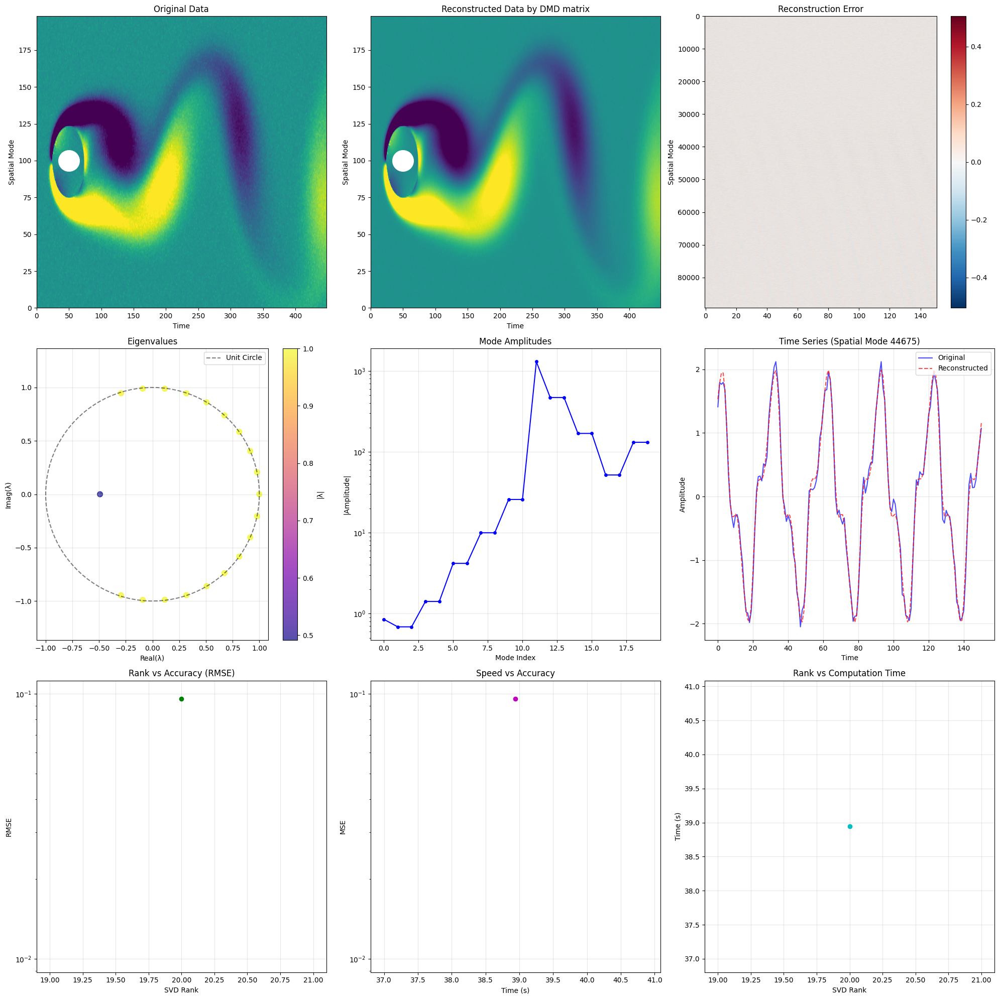

Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 30
Precision: double
Device: CPU
Creating Hankel matrix with delay d=30...
Hankel matrix shape: (2680530, 122)
H1 shape: (2680530, 121), H2 shape: (2680530, 121)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 121
Performing eigendecomposition...
Number of modes: 121
Eigenvalue range: [9.75e-01, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 30
Precision: double
Device: CPU
Creating Hankel matrix with delay d=30...
Hankel matrix shape: (2680530, 122)
H1 shape: (2680530, 121), H2 shape: (2680530, 121)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [4.79e-01, 1.00e+00]
Benchmark completed.


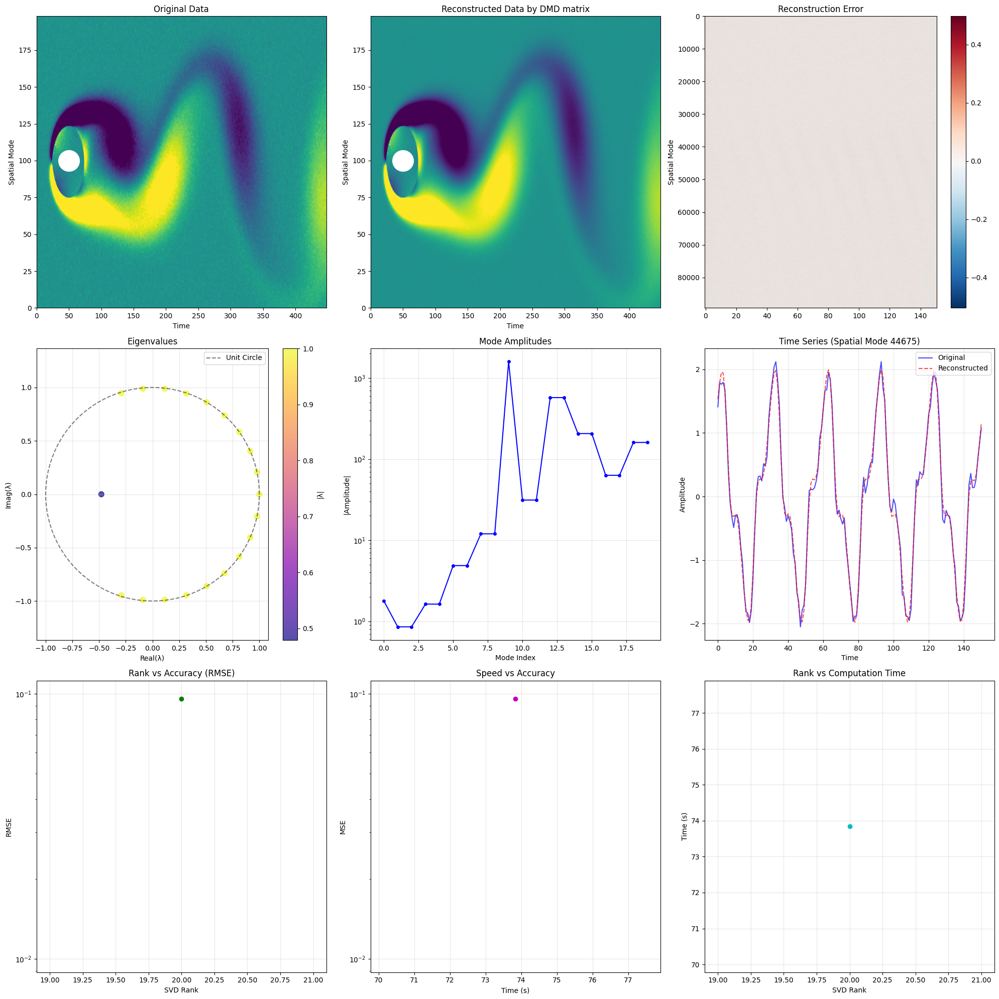

Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 50
Precision: double
Device: CPU
Creating Hankel matrix with delay d=50...
Hankel matrix shape: (4467550, 102)
H1 shape: (4467550, 101), H2 shape: (4467550, 101)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 101
Performing eigendecomposition...
Number of modes: 101
Eigenvalue range: [4.32e-01, 1.00e+00]
Starting benchmark analysis...
Testing SVD rank: 20
Starting HODMD Analysis
Data shape: (89351, 151)
Time delay: 50
Precision: double
Device: CPU
Creating Hankel matrix with delay d=50...
Hankel matrix shape: (4467550, 102)
H1 shape: (4467550, 101), H2 shape: (4467550, 101)
Performing SVD decomposition with double precision...
SVD completed. Reduced rank: 20
Performing eigendecomposition...
Number of modes: 20
Eigenvalue range: [5.35e-01, 1.00e+00]
Benchmark completed.


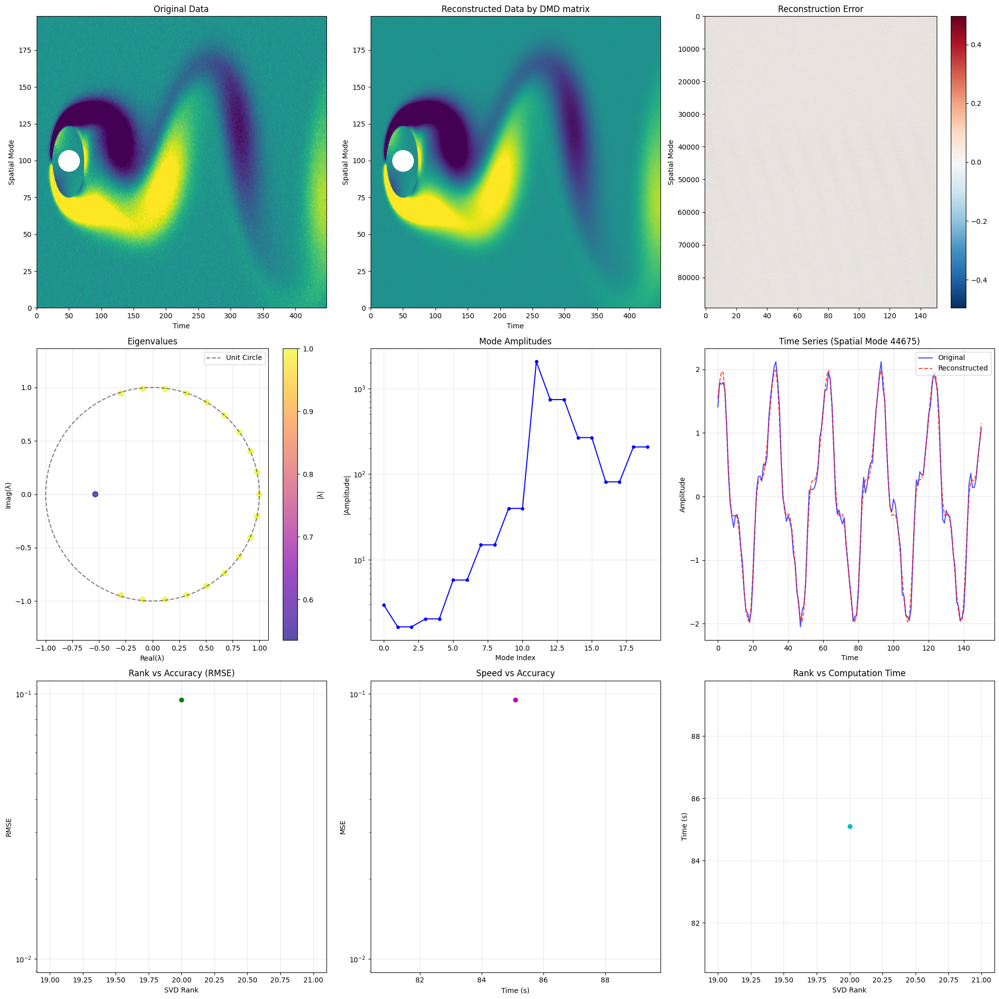

In [5]:
# for d in [20, 30, 40, 50]:
#     print(f"\n\nDelay = {d}\n\n")
for d in [20, 30, 50]:
    hodmd = HODMD(d=d,gpu=False, precision='double')
    hodmd.fit(X)
    hodmd.benchmark_analysis(X, rank_list=np.arange(20,21))
    hodmd.visualize_results()
    hodmd.compute_statistics()
    

## TT-DMD with noisy data

Test data created with shape: (449, 199, 151)
Starting DMD-TT Analysis
Input data shape: (449, 199, 151)
Algorithm 1: TT Decomposition
TT decomposition successful with ranks: [(1, 449, 20), (20, 199, 20), (20, 151, 1)]
Algorithm 2: Orthogonalization
Orthogonalization completed
Algorithm 3: Pseudo Inverse Computation
Pseudo inverse computed with effective rank: 20
Algorithm 4: DMD Computation
DMD computation completed with 130 modes
Eigenvalue magnitudes range: [0.148618, 1.000009]
Creating Hankel matrix with shape=(89351, 151)...
Algorithm 5: Data Reconstruction
Reconstruction completed with relative error: 0.086150
Algorithm 6: Quality Assessment
Quality Statistics:
  Relative Error: 0.086150
  Energy Ratio: 0.990986
  Correlation: 0.996282
  Stable/Unstable Modes: 127/3


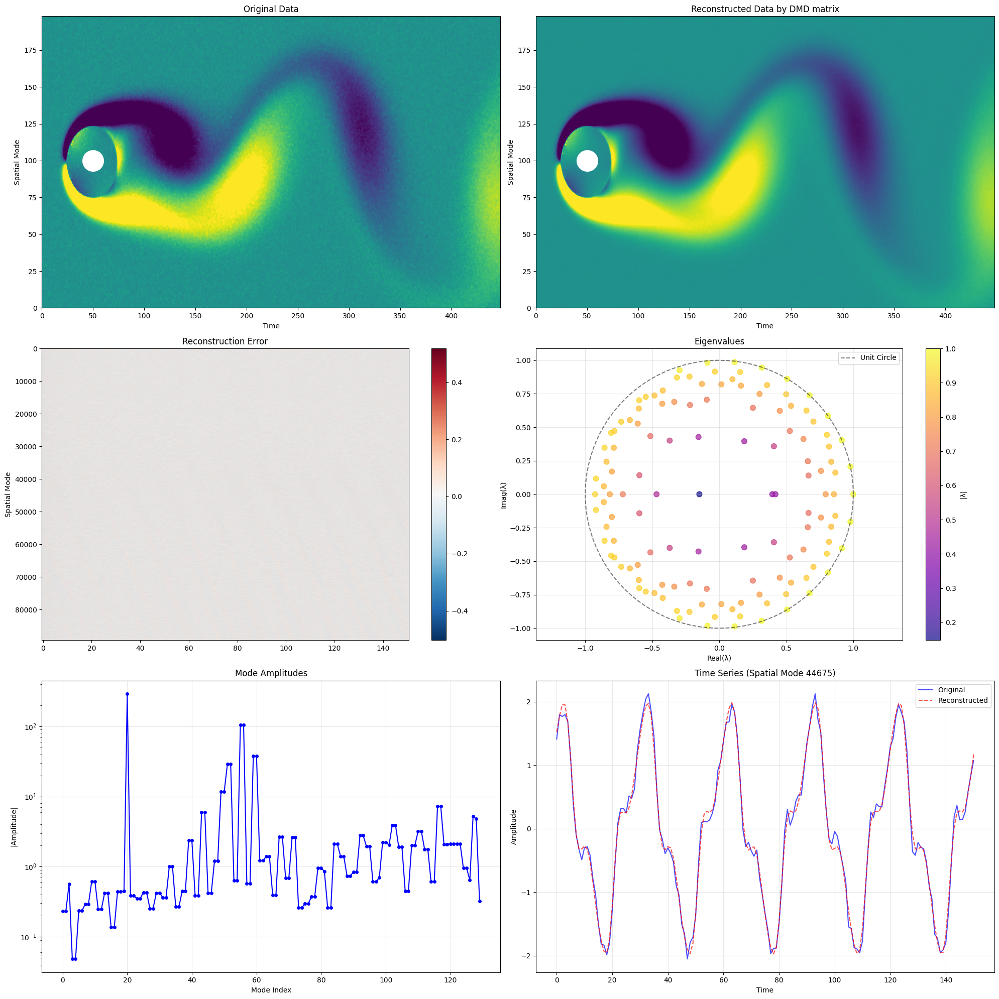

Starting benchmark analysis...
Testing SVD rank: 1
Starting DMD-TT Analysis
Input data shape: (449, 199, 151)
Algorithm 1: TT Decomposition
TT decomposition successful with ranks: [(1, 449, 20), (20, 199, 20), (20, 151, 1)]
Algorithm 2: Orthogonalization
Orthogonalization completed
Algorithm 3: Pseudo Inverse Computation
Pseudo inverse computed with effective rank: 20
Algorithm 4: DMD Computation
DMD computation completed with 130 modes
Eigenvalue magnitudes range: [0.148618, 1.000009]
Creating Hankel matrix with shape=(89351, 151)...
Algorithm 5: Data Reconstruction
Reconstruction completed with relative error: 0.086150
Algorithm 6: Quality Assessment
Quality Statistics:
  Relative Error: 0.086150
  Energy Ratio: 0.990986
  Correlation: 0.996282
  Stable/Unstable Modes: 127/3
Testing SVD rank: 2
Starting DMD-TT Analysis
Input data shape: (449, 199, 151)
Algorithm 1: TT Decomposition
TT decomposition successful with ranks: [(1, 449, 20), (20, 199, 20), (20, 151, 1)]
Algorithm 2: Orthog

In [6]:

# Example usage and test
def create_test_data():

    
    f = X.reshape(449,199,-1)
    
    print(f"Test data created with shape: {f.shape}")
    return f
# Run example

if __name__ == "__main__":
    test_data = create_test_data()
    
    # Initialize HODMD-TT
    hodmd = DMD_TT(rank=20, svd_rank=20)
    
    # Fit the model
    reconstructed_data, quality_stats = hodmd.fit(test_data)
    
    # Visualize results
    hodmd.visualize_results(test_data,reconstructed_data)
    hodmd.benchmark_analysis(test_data,reconstructed_data)
    print("\nDMD-TT Analysis with noisy data Complete!")
    print("=" * 50)